# Yoga pose generation

*References:*
- Dataset: https://www.kaggle.com/niharika41298/yoga-poses-dataset 

    --> we removed the background of the images (this leads to better results as the subject of the image is clear and there is no noise of the background)

    --> we removed some of the images that were of very bad quality, unclear or were drawings 

    --> we added some new images retrieved from google images

    --> we put all of the images in the same format (jpg)

    --> we annotated the images (using https://www.makesense.ai/)
- Preprocessing: https://www.kaggle.com/paulorzp/show-annotations-and-breeds and https://www.kaggle.com/jesucristo/introducing-dcgan-dogs-images#What-is-DCGAN?
- Model: https://www.kaggle.com/jesucristo/introducing-dcgan-dogs-images#What-is-DCGAN? 
- Extra information on the model and the hyperparameters: https://www.youtube.com/watch?v=EYrt7fGyA08
- Optimization: https://www.kaggle.com/jadeblue/dcgans-and-techniques-to-optimize-them

## 1. Preprocessing

First of all, load the necessary packages.


In [ ]:
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave
import os
import pandas as pd
import os
import zipfile 

Now, load the images:

In [ ]:
#load the images
all_images=os.listdir("generative-yoga-images/all-poses/all-poses")

#count the images
print(f"Total images : {len(all_images)}")

Total images : 1035


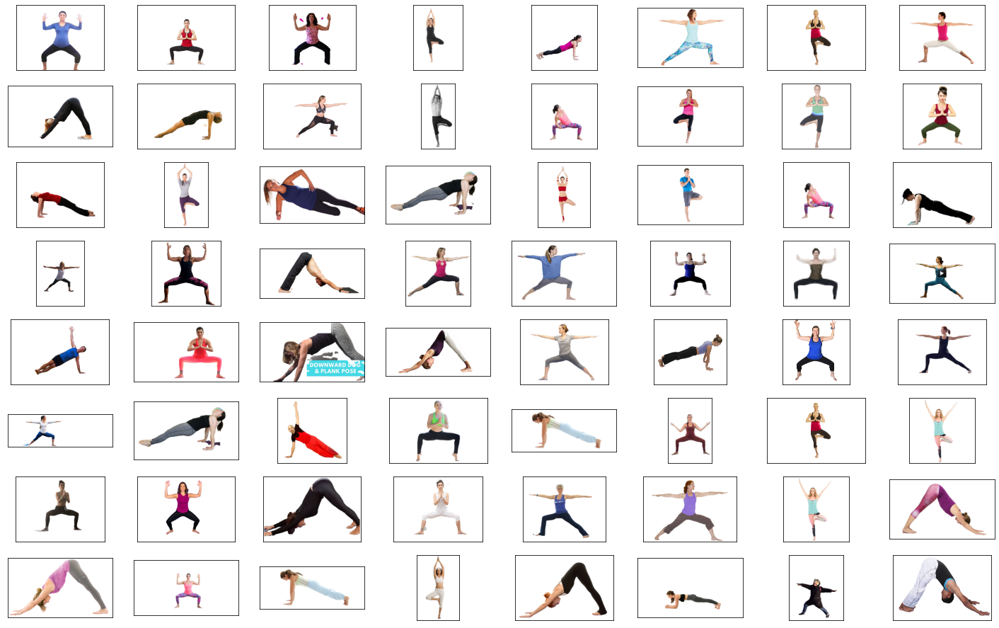

In [ ]:
img_base_path = "generative-yoga-images/all-poses/all-poses"
images=os.listdir("generative-yoga-images/all-poses/all-poses")
# choose 64 random images to display
images_to_display = random.choices(images, k=64)
# display the images
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(8, 8, ii + 1, xticks=[], yticks=[])
    
    img = Image.open(os.path.join(img_base_path, img))
    plt.imshow(img)

the following code is test code for cropping the images using the bounding boxes, I did not delete it because it clearly displays what is done: 

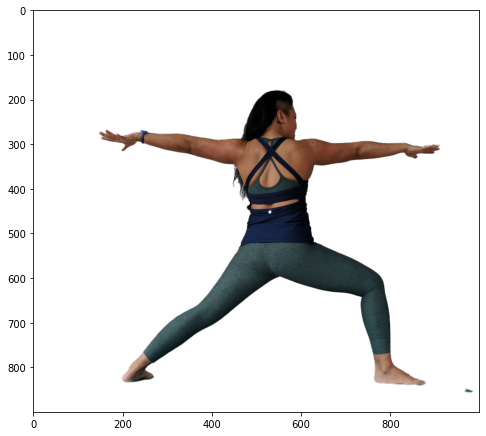

In [ ]:
# (test code) choose an image and display a bit bigger
image_name = 'warrior2 (10).jpg'
img = Image.open(os.path.join(img_base_path, image_name))

# display image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
#(test code)
#image_name[:-4]

In [ ]:
# (test code) finding annotation of this particular image
# image name == annotation name

annotation_folders = os.listdir('generative-yoga-images/annotations')
breed_folder = [x for x in annotation_folders if image_name.split(' ')[0] in x]
assert len(breed_folder) == 1, "Multiple Folders Found"

breed_folder = breed_folder[0]
print("Image Folder: ", breed_folder)
annotation_path = os.path.join('generative-yoga-images/annotations', breed_folder, image_name[:-4] +'.xml')
print("Annotation Path: ", annotation_path)


Image Folder:  warrior2
Annotation Path:  generative-yoga-images/annotations/warrior2/warrior2 (10).xml


In [ ]:
#(test code) display the annotation of the image
!cat '/content/generative-yoga-images/annotations/warrior2/warrior2 (10).xml'

<annotation>
	<folder>warrior2</folder>
	<filename>warrior2 (10).jpg</filename>
	<path>/warrior2/warrior2 (10).jpg</path>
	<source>
		<database>Unspecified</database>
	</source>
	<size>
		<width>1000</width>
		<height>900</height>
		<depth>3</depth>
	</size>
	<object>
		<name>warrior2</name>
		<pose>Unspecified</pose>
		<truncated>Unspecified</truncated>
		<difficult>Unspecified</difficult>
		<bndbox>
			<xmin>134</xmin>
			<ymin>162</ymin>
			<xmax>911</xmax>
			<ymax>861</ymax>
		</bndbox>
	</object>
</annotation>

Bounding Box:  (134, 162, 911, 861)


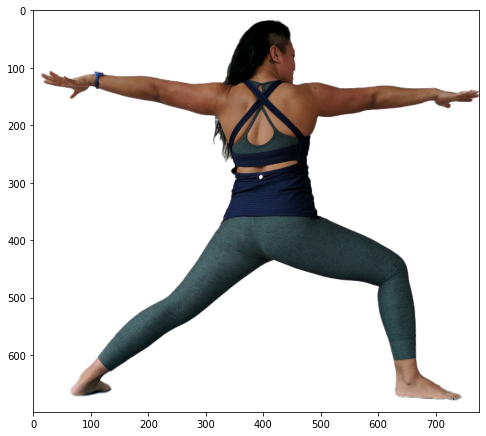

In [ ]:
# (test code) crop the image using the bounding box
tree = ET.parse(annotation_path)
root = tree.getroot()
objects = root.findall('object')
for obj in objects:
    bndbox = obj.find('bndbox')
    xmin = int(bndbox.find('xmin').text)
    ymin = int(bndbox.find('ymin').text)
    xmax = int(bndbox.find('xmax').text)
    ymax = int(bndbox.find('ymax').text)
bbox = (xmin, ymin, xmax, ymax)
print("Bounding Box: ", bbox)

# crop image
img = img.crop(bbox)

# display cropped image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

As the test code works, it is now applied crop the other images as well. Furthermore the images are reshaped to the right format to input in the model afterwards: 

In [ ]:
#!ls all-poses/all-poses

In [ ]:
#now this is applied to crop all of the images
root_images = "generative-yoga-images/all-poses/all-poses/"
root_annots = "generative-yoga-images/annotations/"
INPUT_DATA_DIR = "generative-yoga-images/all-poses/all-poses/"
IMG_DIR = "generated-images"
ComputeLB = False 
PosesOnly = True

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000


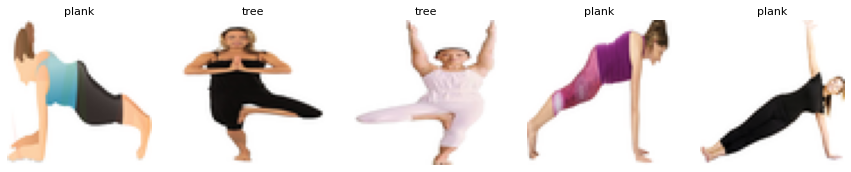

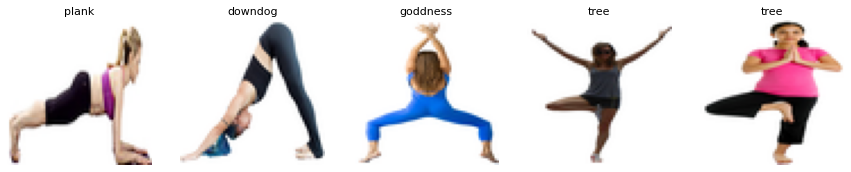

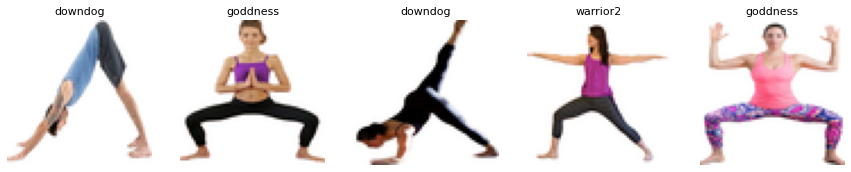

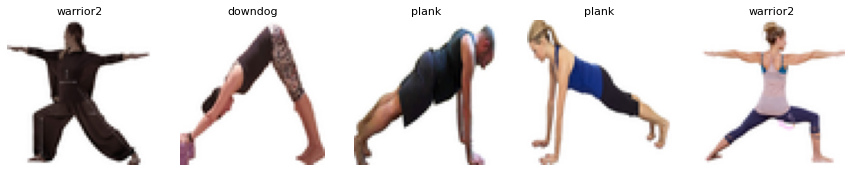

In [ ]:
ImageFile.LOAD_TRUNCATED_IMAGES = True
ROOT = 'generative-yoga-images/'
IMAGES = os.listdir(ROOT + 'all-poses/all-poses/')
#poses = os.listdir(ROOT + 'annotations/') 
poses=['tree', 'plank', 'goddness', 'downdog', 'warrior2'] 

idxIn = 0; namesIn = []
imagesIn = np.zeros((1038,64,64,3))

# crop the images with the bounding boxes to get only the yoga poses
if PosesOnly:
    for pose in poses:
        for POSE in os.listdir(ROOT+'annotations/'+pose):
            try: img = Image.open(ROOT+'all-poses/all-poses/'+POSE[:-4]+'.jpg').convert('RGB') 
            except: continue           
            tree = ET.parse(ROOT+'annotations/'+pose+'/'+POSE)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                bbox = (xmin, ymin, xmax, ymax)
                img2 = img.crop(bbox)
                img2 = img2.resize((64,64), Image.ANTIALIAS) #resize the images to 64x64 (the input format for the model)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                if idxIn%50==0: print(idxIn)
                namesIn.append(pose)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]

# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,20)
for k in range(4):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not PosesOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]],fontsize=11)
        plt.imshow(img)
    plt.show()

## 2. Modeling

The model that is being used for generating new yoga poses is DCGAN. The architecture of the model is show in the image below: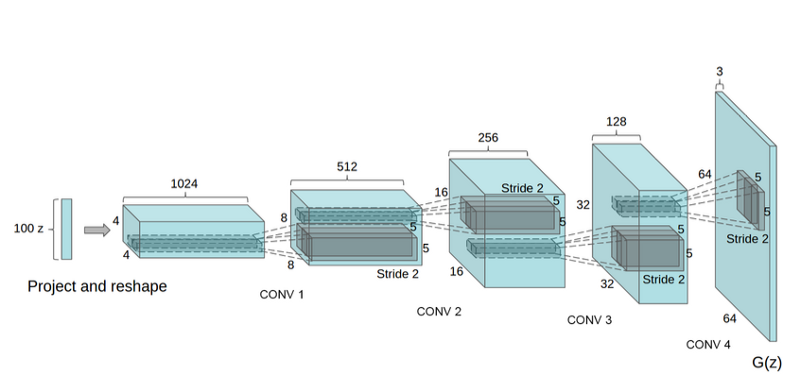

### **Generator**

In [ ]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        
        # 4x4x512
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 4x4x512 -> 8x8x256
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 8x8x256 -> 16x16x128
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
                # 16x16x128 -> 32x32x64
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        

        # 32x32x64 -> 64x64x32
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=32,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 64x64x32 -> 64x64x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out


### **Discriminator**

In [ ]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 64x64x3 -> 32x32x32
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 32x32x32 -> 16x16x64
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 16x16x64 -> 8x8x128
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
         # 8x8x128 -> 8x8x256
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 8x8x256 -> 4x4x512
        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

### **Loss and Optimizer**

In [ ]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [ ]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [ ]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

### **Utils**

In [ ]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()


In [ ]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [ ]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [ ]:
def generate (sess, input_z, out_channel_dim):
    print (">> Generating 1k images ...")
    for i in tqdm(range(100)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        for j in range(len(imgs)):
            imsave(os.path.join(IMG_DIR, f'pose_{i}_{j}.png'), imgs[j])

In [ ]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [ ]:
  def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

## 3. Training

Now the model is being trained.

In [ ]:
!mkdir images
!ls

mkdir: cannot create directory ‘images’: File exists
generated-images  generative-yoga-images  images  sample_data


In [ ]:
# definition for training the model using the hyperparameters given as input
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
  
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()

### **hyperparameters**

Hyperparameters are chosen by testing some different values.

In [ ]:
IMAGE_SIZE = 64
NOISE_SIZE = 50 #eerst 100
LR_D = 0.0005  #learning rate discriminator
LR_G = 2e-4    #learning rate generator
BATCH_SIZE = 32 #eerst 64
EPOCHS = 120 #eerst 100
BETA1_G = 0.5  #bet1 value for adam optimizer in generator
BETA1_D = 0.5  #bet1 value for adam optimizer in discriminator
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

### **training loop**

In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


>> Start training...
Instructions for updating:
Colocations handled automatically by placer.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1692: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/convolutional.py:1294: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  warnings.warn('`tf.layers.conv2d_transpose` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/normalization.py:308: UserWarning: `tf.layers.batch_

Epoch 1/120 
Duration: 166.65963 
D Loss: 1.94062 
G Loss: 7.48888


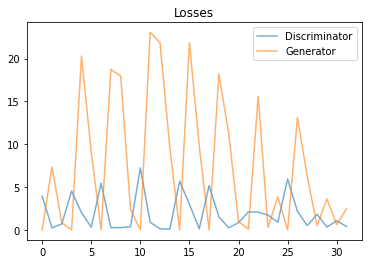

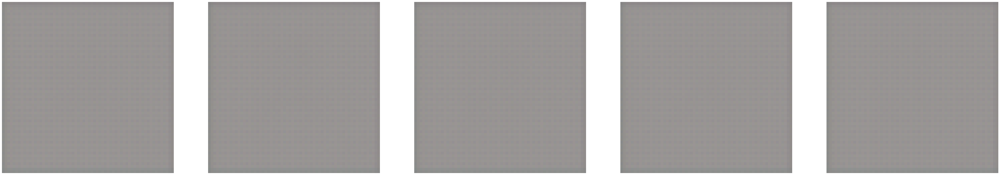

Epoch 2/120 
Duration: 166.96464 
D Loss: 0.73760 
G Loss: 2.49700


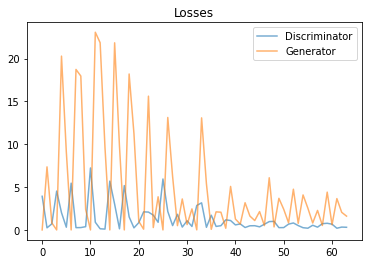

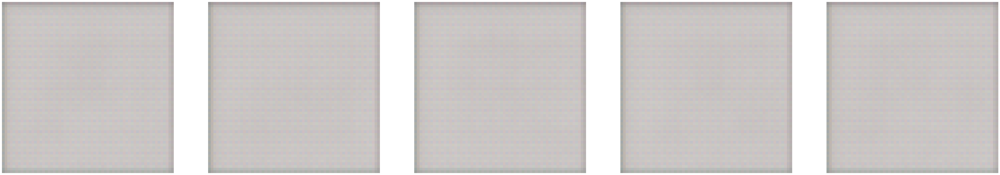

Epoch 3/120 
Duration: 167.43889 
D Loss: 0.57369 
G Loss: 2.15458


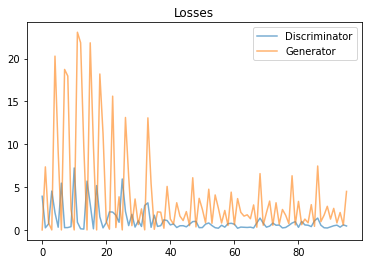

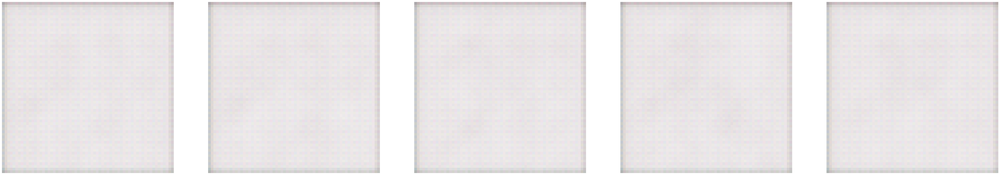

Epoch 4/120 
Duration: 168.96419 
D Loss: 0.61438 
G Loss: 2.01571


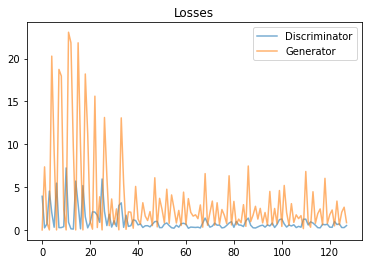

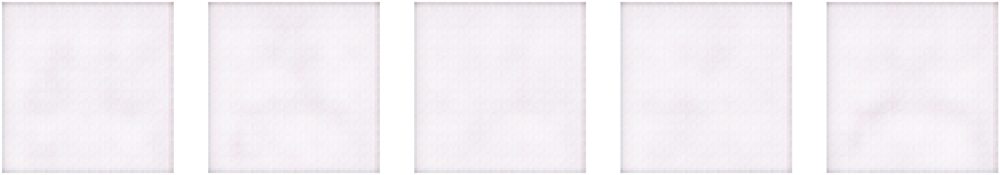

Epoch 5/120 
Duration: 171.17879 
D Loss: 0.52104 
G Loss: 2.09782


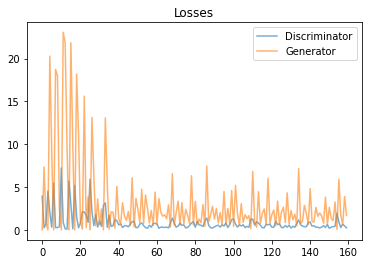

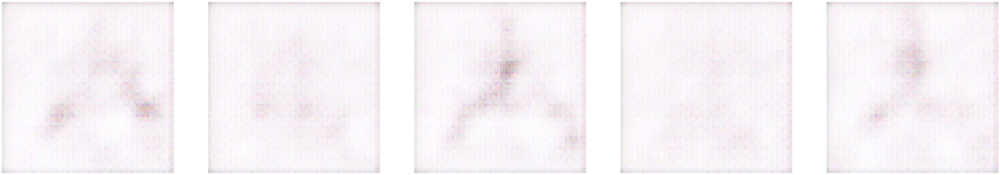

Epoch 6/120 
Duration: 165.54066 
D Loss: 0.39752 
G Loss: 1.93348


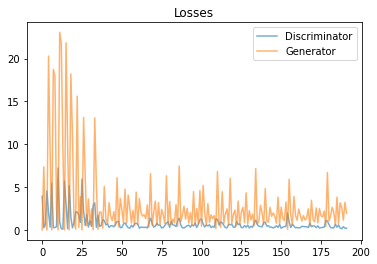

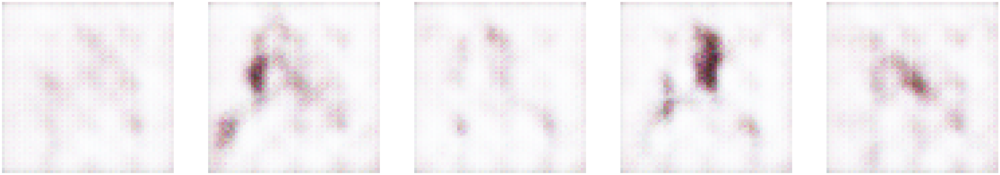

Epoch 7/120 
Duration: 166.52260 
D Loss: 0.40925 
G Loss: 2.13414


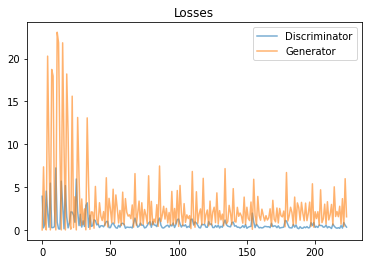

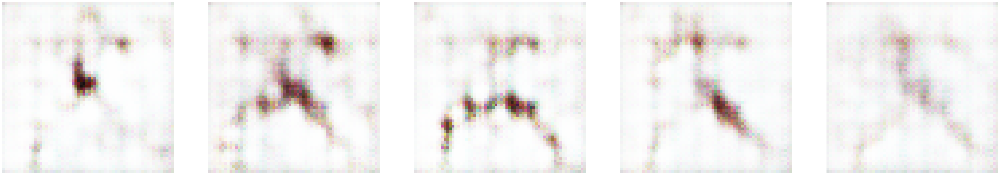

Epoch 8/120 
Duration: 167.87842 
D Loss: 0.42335 
G Loss: 2.26695


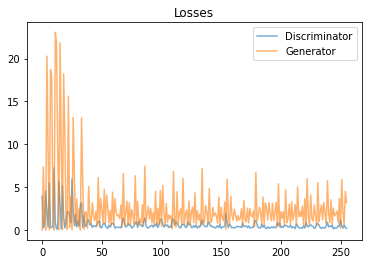

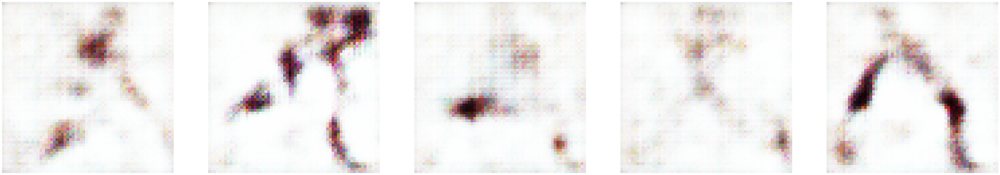

Epoch 9/120 
Duration: 169.62340 
D Loss: 0.36732 
G Loss: 2.12301


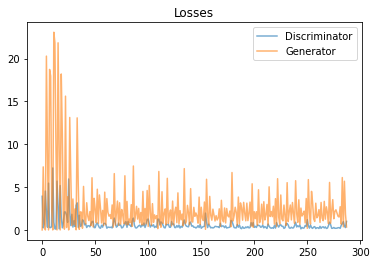

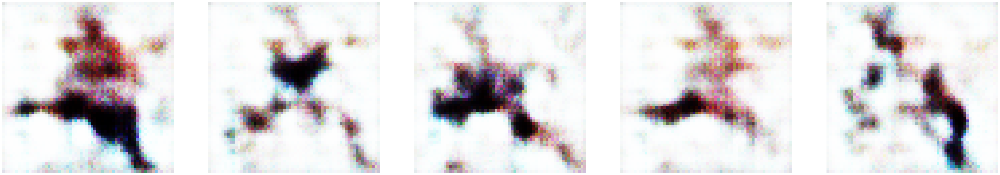

Epoch 10/120 
Duration: 169.79150 
D Loss: 0.34185 
G Loss: 2.04811


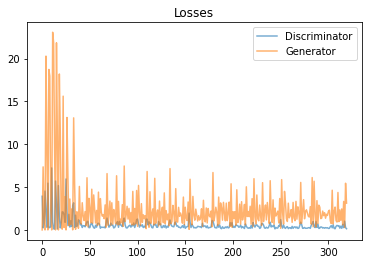

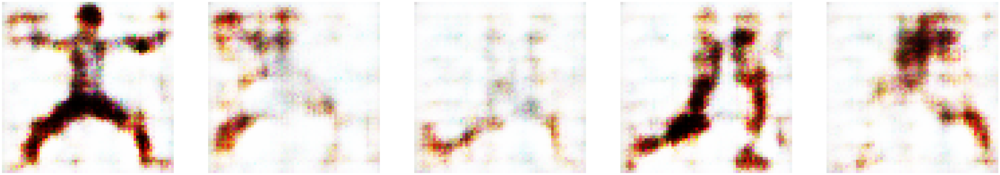

Epoch 11/120 
Duration: 168.60735 
D Loss: 0.38790 
G Loss: 2.15642


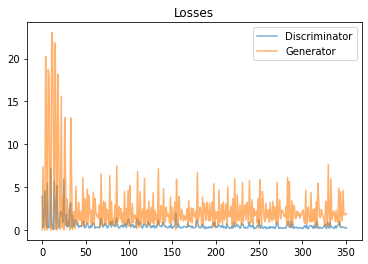

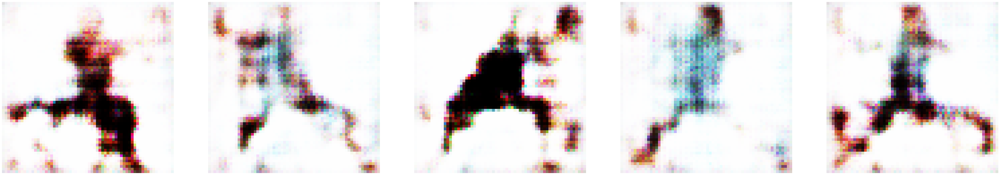

Epoch 12/120 
Duration: 167.80943 
D Loss: 0.34644 
G Loss: 2.38317


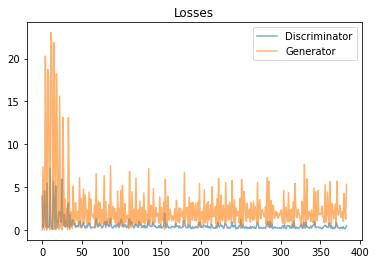

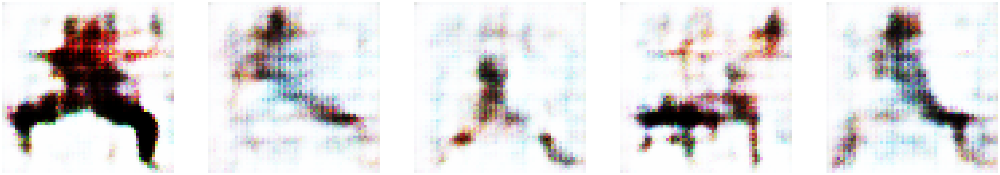

Epoch 13/120 
Duration: 167.03905 
D Loss: 0.31855 
G Loss: 2.11753


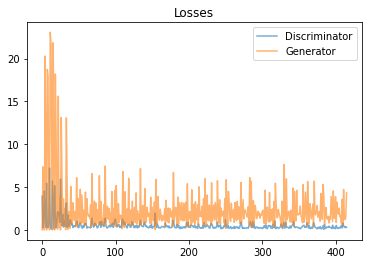

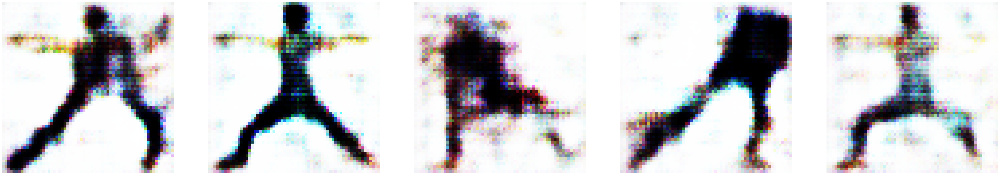

Epoch 14/120 
Duration: 167.48689 
D Loss: 0.40762 
G Loss: 2.19187


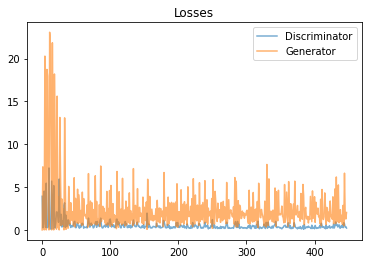

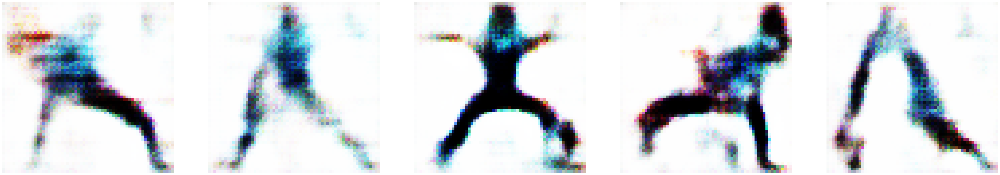

Epoch 15/120 
Duration: 167.10242 
D Loss: 0.38186 
G Loss: 1.96314


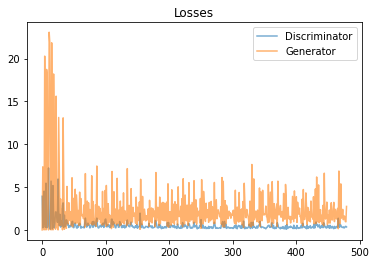

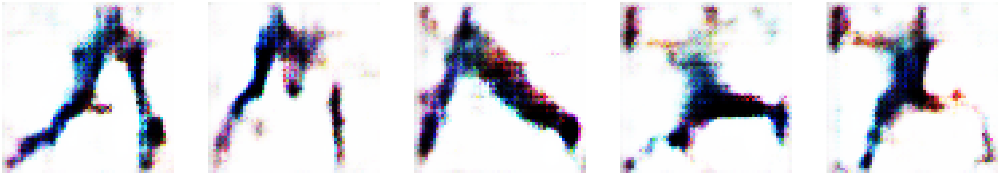

Epoch 16/120 
Duration: 166.61401 
D Loss: 0.36944 
G Loss: 1.94337


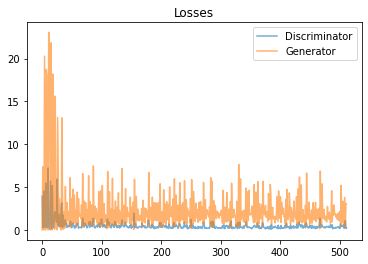

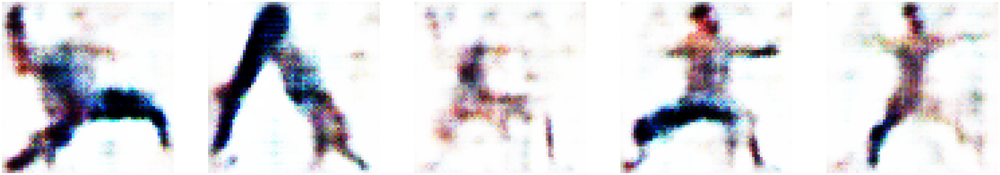

Epoch 17/120 
Duration: 166.36113 
D Loss: 0.33591 
G Loss: 2.04414


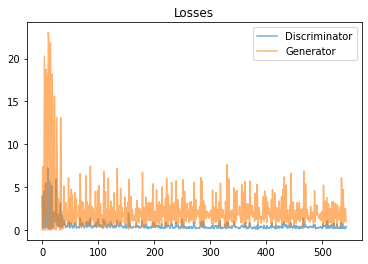

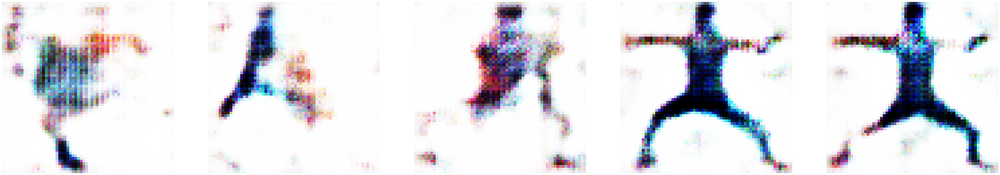

Epoch 18/120 
Duration: 166.72957 
D Loss: 0.43683 
G Loss: 2.03360


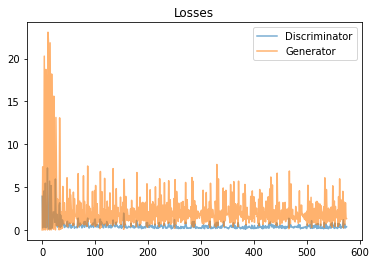

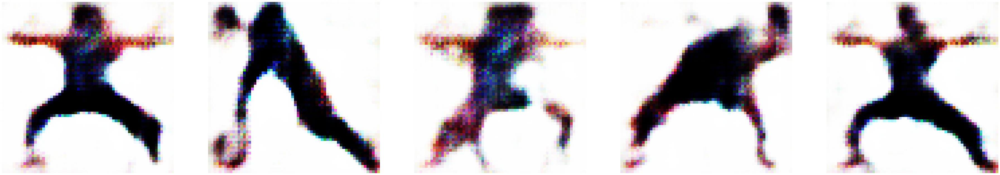

Epoch 19/120 
Duration: 166.57003 
D Loss: 0.39197 
G Loss: 1.92862


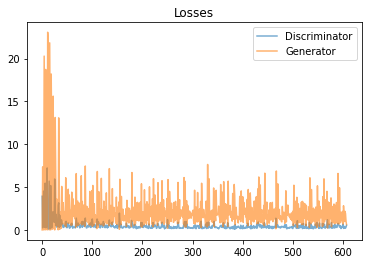

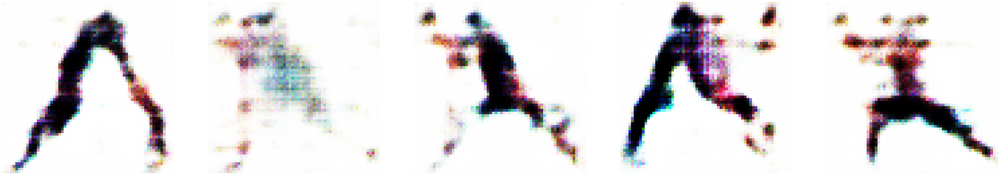

Epoch 20/120 
Duration: 167.12970 
D Loss: 0.27314 
G Loss: 1.94988


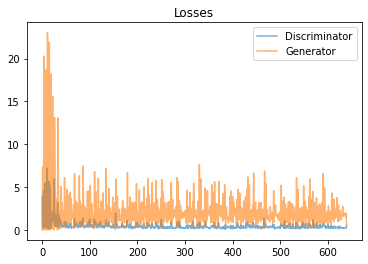

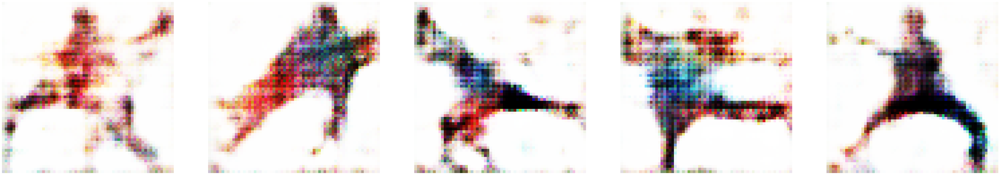

Epoch 21/120 
Duration: 167.43830 
D Loss: 0.46699 
G Loss: 2.19045


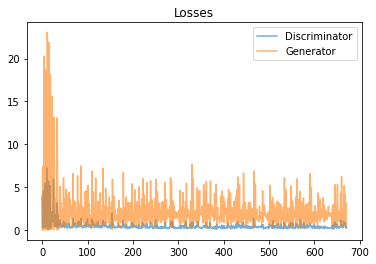

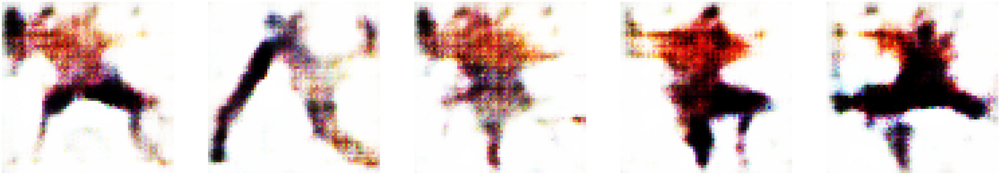

Epoch 22/120 
Duration: 169.69907 
D Loss: 0.31054 
G Loss: 1.88993


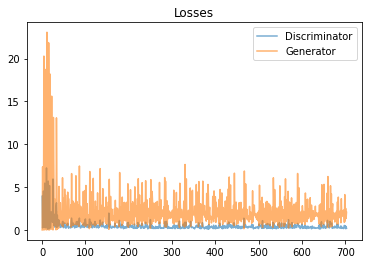

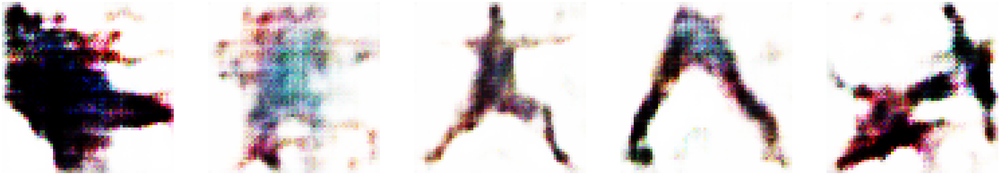

Epoch 23/120 
Duration: 165.30149 
D Loss: 0.31373 
G Loss: 2.01774


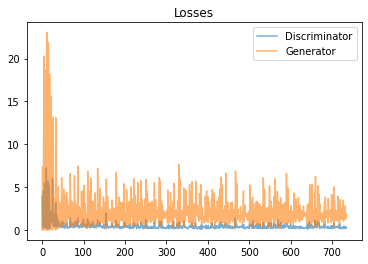

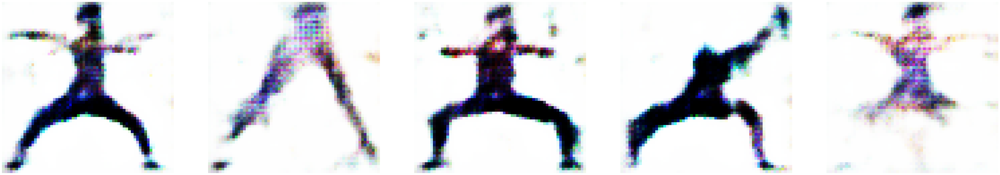

Epoch 24/120 
Duration: 166.99585 
D Loss: 0.45287 
G Loss: 2.32779


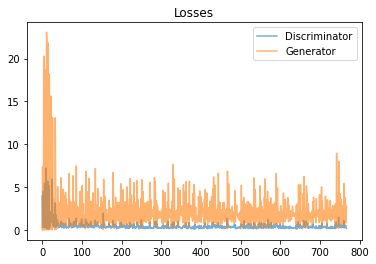

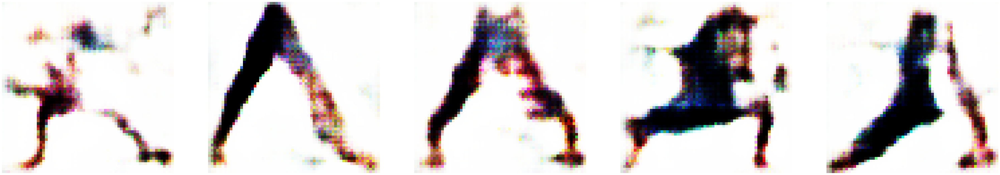

Epoch 25/120 
Duration: 165.34622 
D Loss: 0.35197 
G Loss: 1.98189


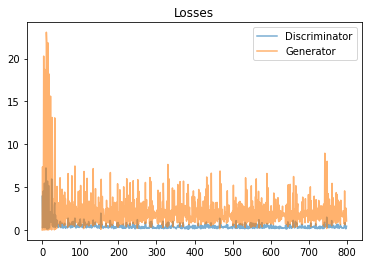

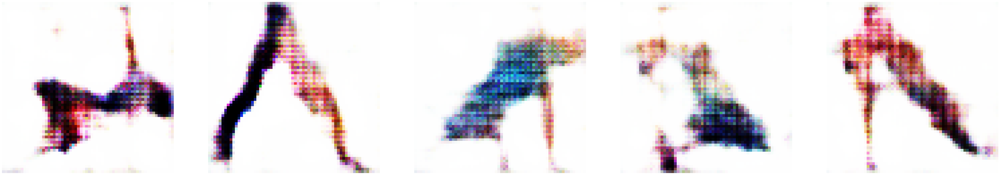

Epoch 26/120 
Duration: 163.90993 
D Loss: 0.24260 
G Loss: 2.10580


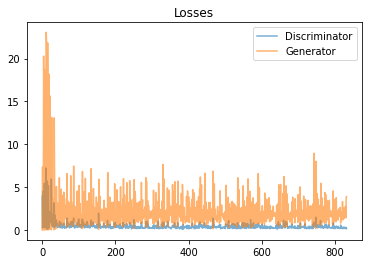

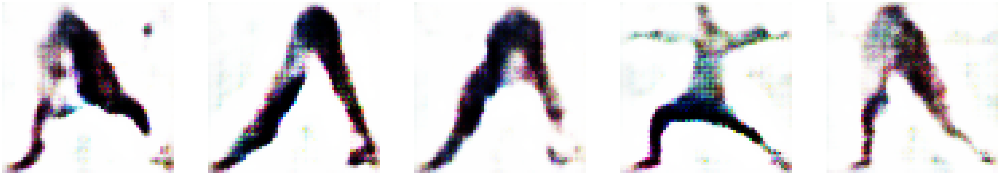

Epoch 27/120 
Duration: 163.65980 
D Loss: 0.29874 
G Loss: 2.08329


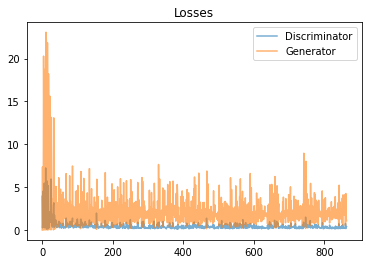

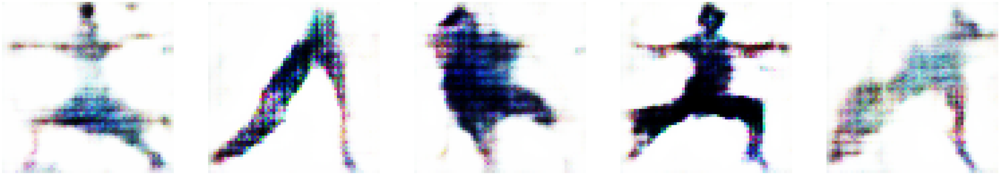

Epoch 28/120 
Duration: 165.77146 
D Loss: 0.43910 
G Loss: 2.39222


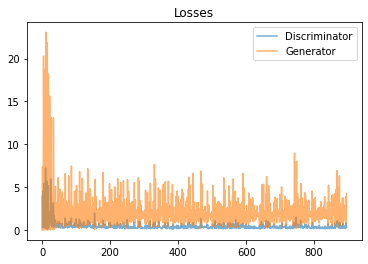

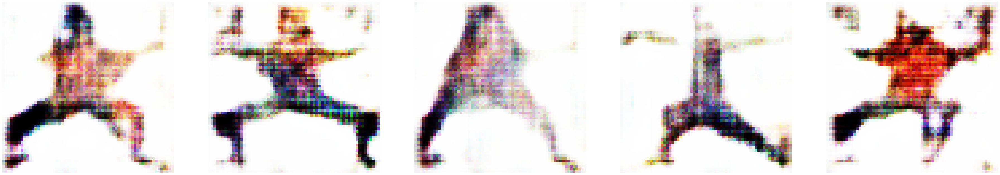

Epoch 29/120 
Duration: 165.98342 
D Loss: 0.33049 
G Loss: 2.07636


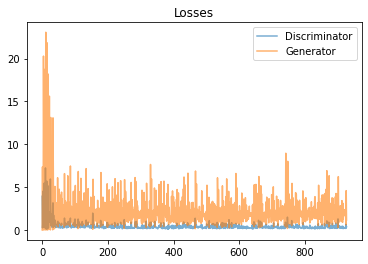

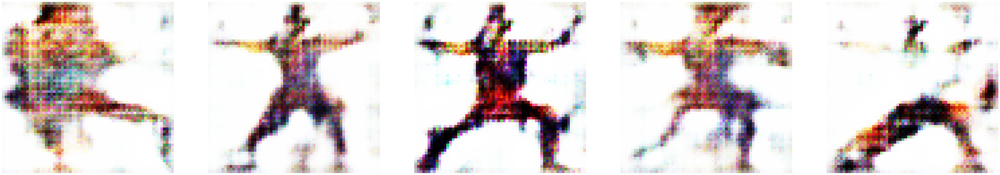

Epoch 30/120 
Duration: 165.53736 
D Loss: 0.29515 
G Loss: 2.08738


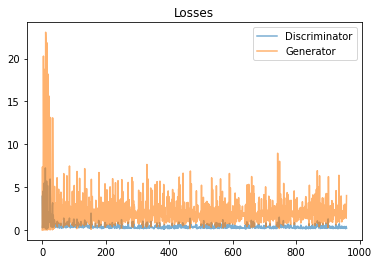

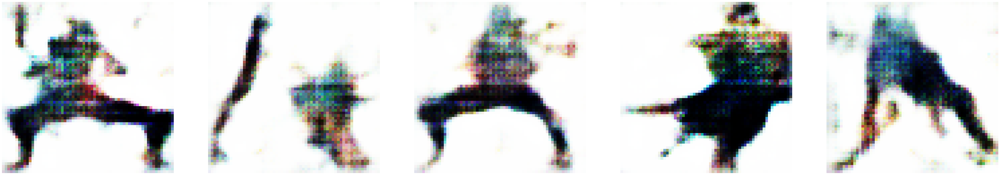

Epoch 31/120 
Duration: 165.05920 
D Loss: 0.24891 
G Loss: 1.87605


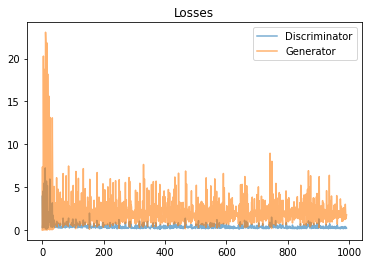

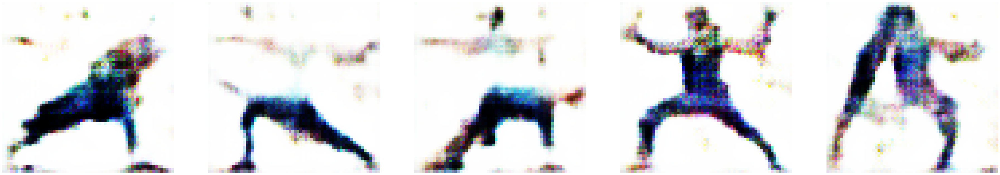

Epoch 32/120 
Duration: 165.64863 
D Loss: 0.46100 
G Loss: 2.06139


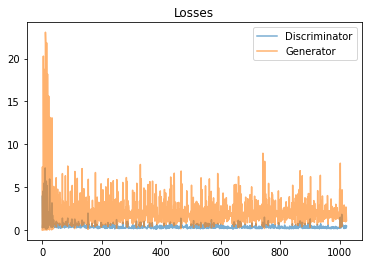

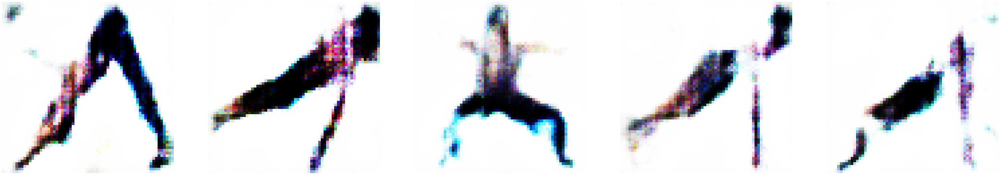

Epoch 33/120 
Duration: 165.43473 
D Loss: 0.29776 
G Loss: 1.96684


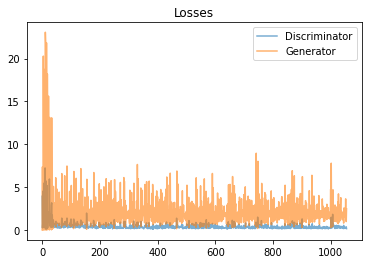

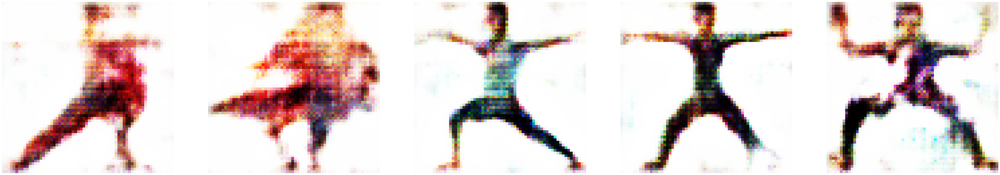

Epoch 34/120 
Duration: 163.45574 
D Loss: 0.27575 
G Loss: 2.04314


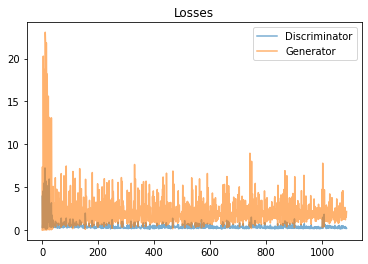

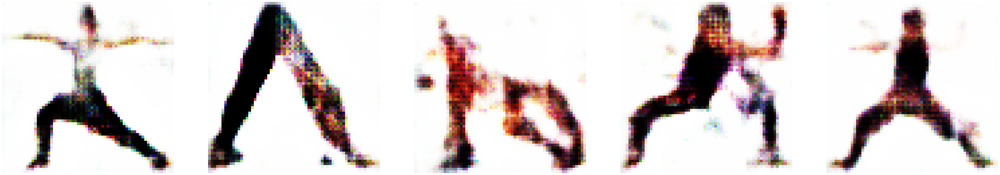

Epoch 35/120 
Duration: 166.20475 
D Loss: 0.31855 
G Loss: 2.15143


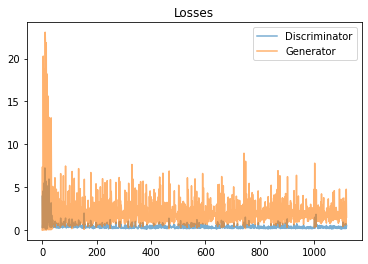

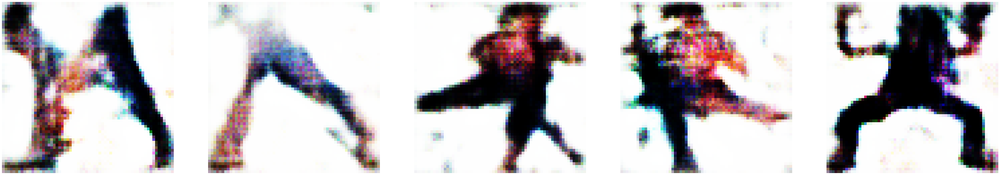

Epoch 36/120 
Duration: 165.34015 
D Loss: 0.28276 
G Loss: 2.09069


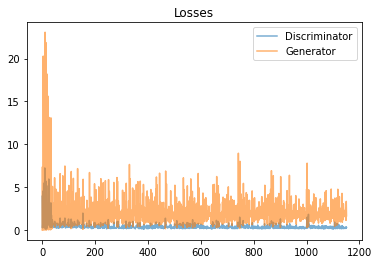

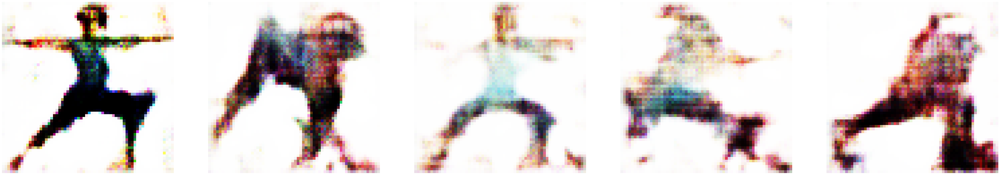

Epoch 37/120 
Duration: 164.28482 
D Loss: 0.30955 
G Loss: 2.10491


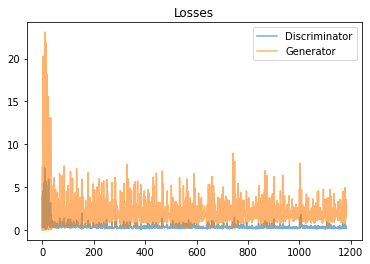

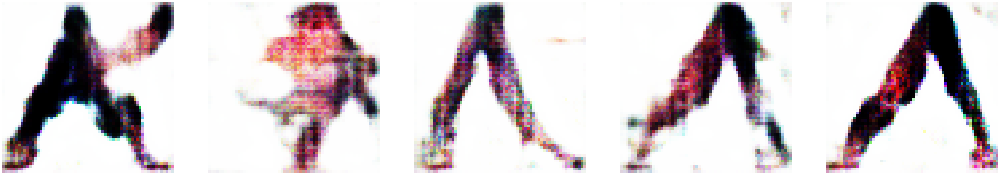

Epoch 38/120 
Duration: 163.60067 
D Loss: 0.38658 
G Loss: 2.28502


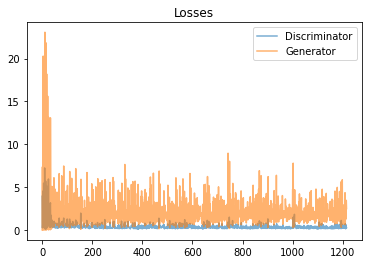

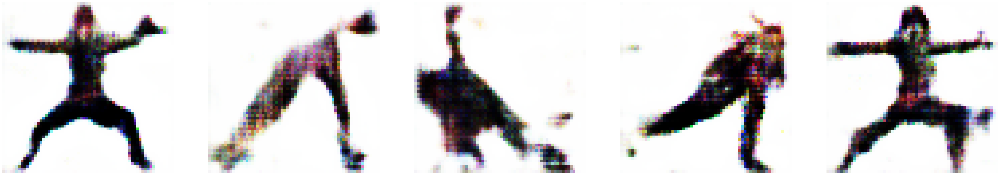

Epoch 39/120 
Duration: 164.25937 
D Loss: 0.25946 
G Loss: 2.21924


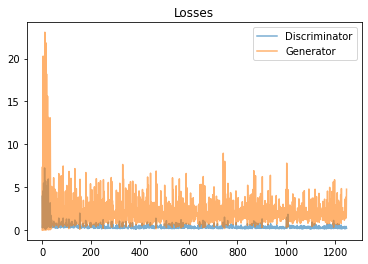

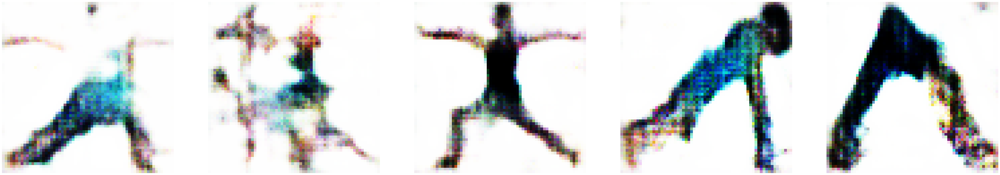

Epoch 40/120 
Duration: 165.04608 
D Loss: 0.29297 
G Loss: 2.18974


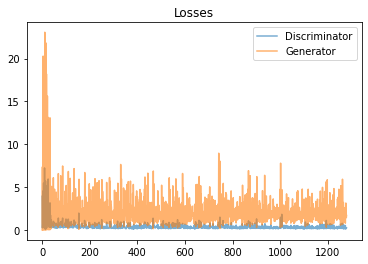

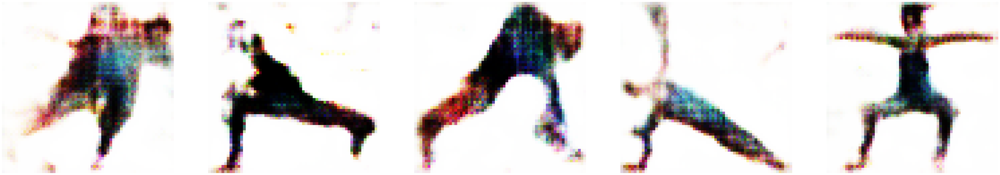

Epoch 41/120 
Duration: 164.86328 
D Loss: 0.24668 
G Loss: 2.33714


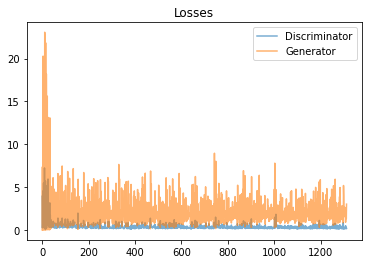

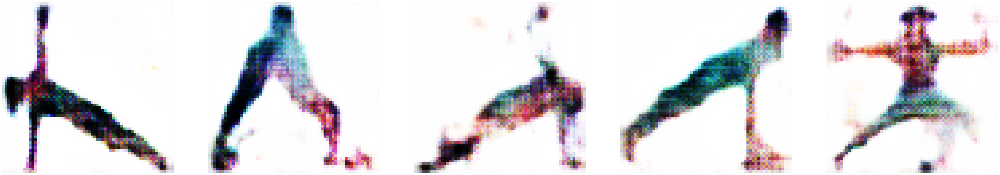

Epoch 42/120 
Duration: 166.52545 
D Loss: 0.42985 
G Loss: 2.67881


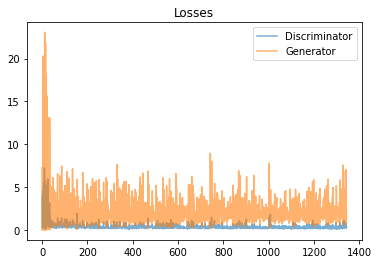

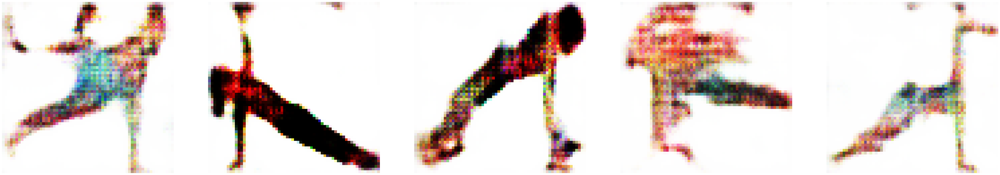

Epoch 43/120 
Duration: 166.63024 
D Loss: 0.34002 
G Loss: 2.39614


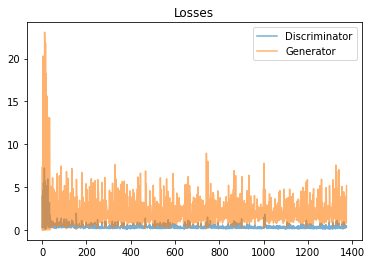

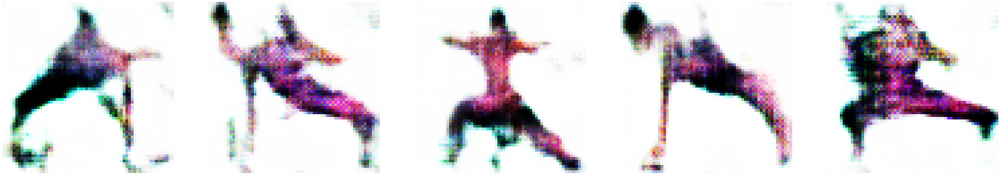

Epoch 44/120 
Duration: 166.12787 
D Loss: 0.26263 
G Loss: 2.20374


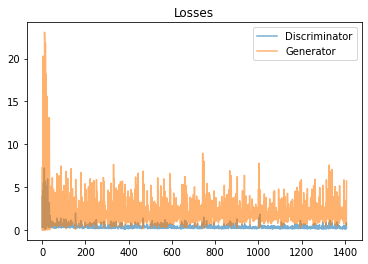

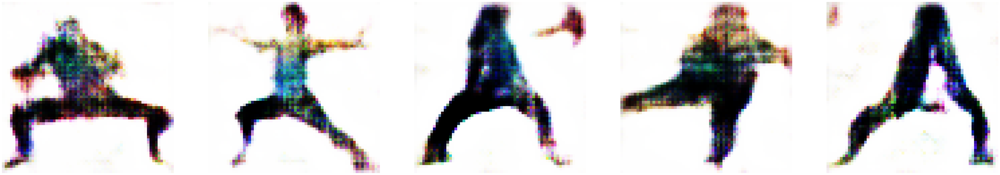

Epoch 45/120 
Duration: 165.63252 
D Loss: 0.22902 
G Loss: 2.13539


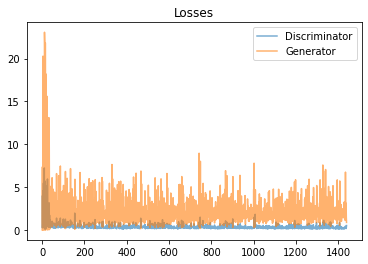

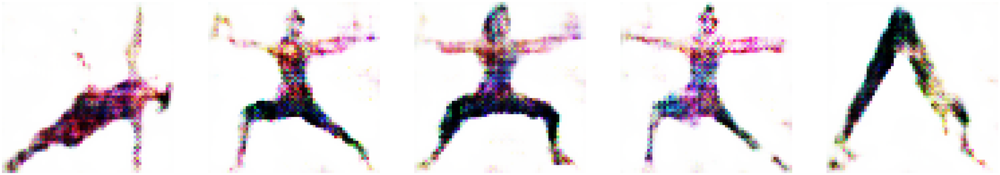

Epoch 46/120 
Duration: 165.03988 
D Loss: 0.22658 
G Loss: 2.31591


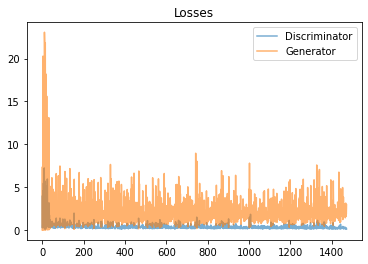

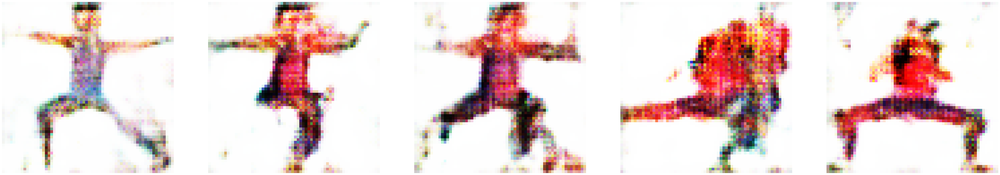

Epoch 47/120 
Duration: 166.03570 
D Loss: 0.47557 
G Loss: 2.61063


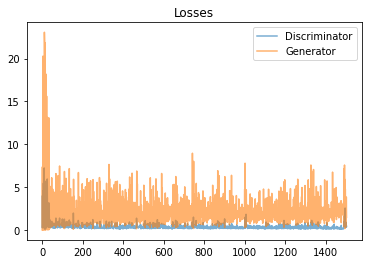

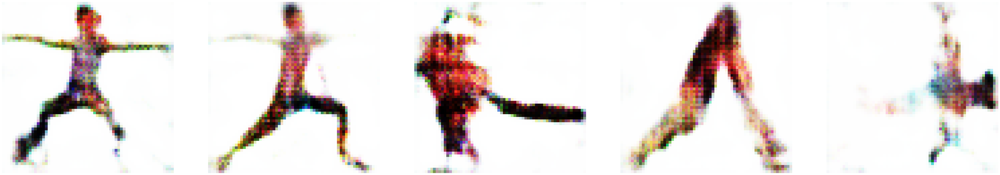

Epoch 48/120 
Duration: 166.26559 
D Loss: 0.32448 
G Loss: 2.07984


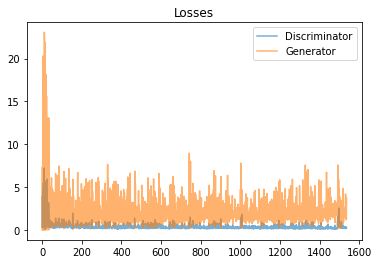

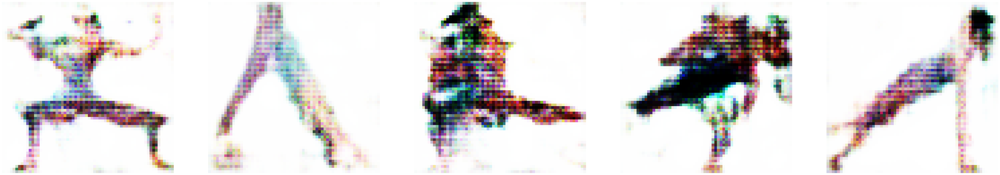

Epoch 49/120 
Duration: 167.60175 
D Loss: 0.23146 
G Loss: 1.95610


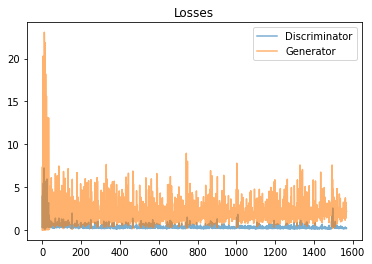

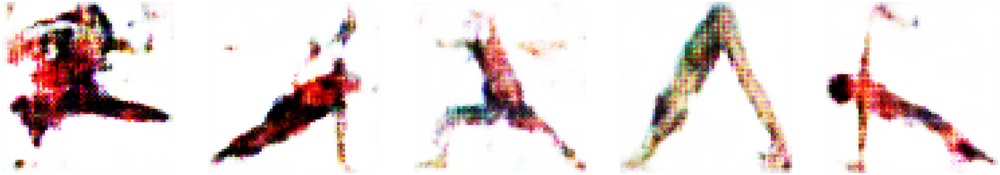

Epoch 50/120 
Duration: 166.40609 
D Loss: 0.23122 
G Loss: 2.26086


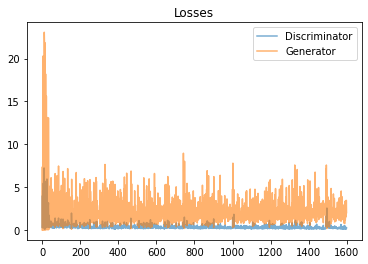

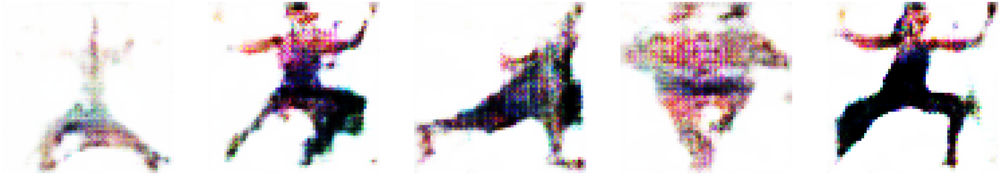

Epoch 51/120 
Duration: 166.63047 
D Loss: 0.25365 
G Loss: 2.14680


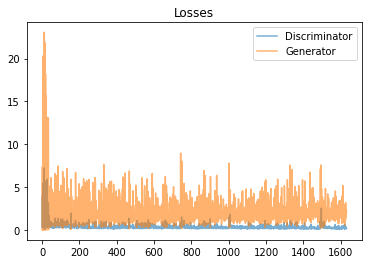

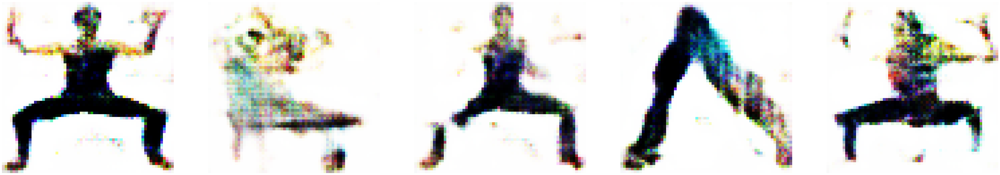

Epoch 52/120 
Duration: 166.29848 
D Loss: 0.22721 
G Loss: 2.44233


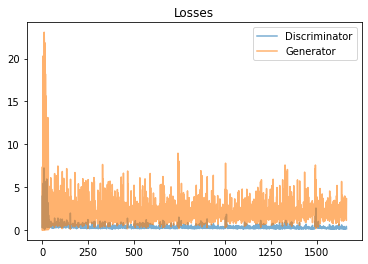

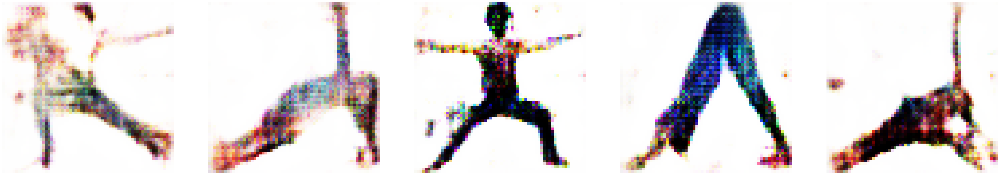

Epoch 53/120 
Duration: 168.52118 
D Loss: 0.24702 
G Loss: 2.44635


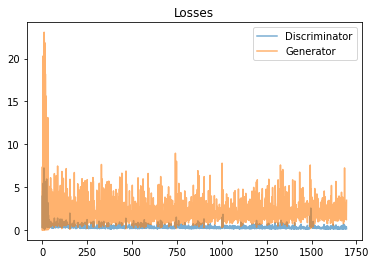

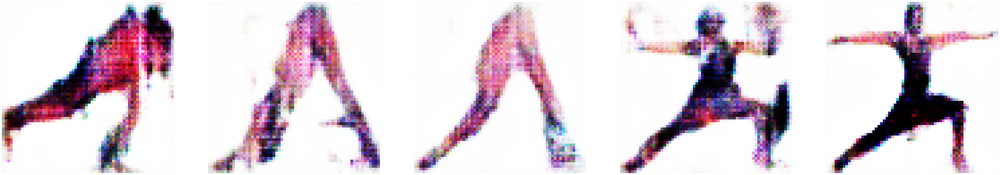

Epoch 54/120 
Duration: 168.26629 
D Loss: 0.18373 
G Loss: 2.37340


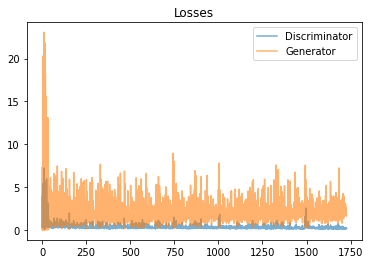

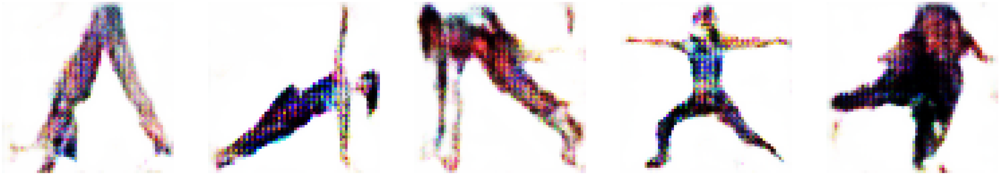

Epoch 55/120 
Duration: 167.94484 
D Loss: 0.24180 
G Loss: 2.49588


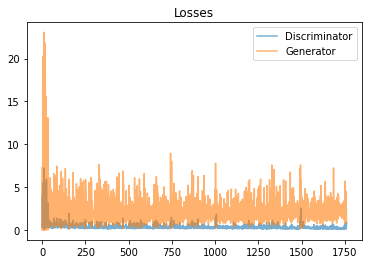

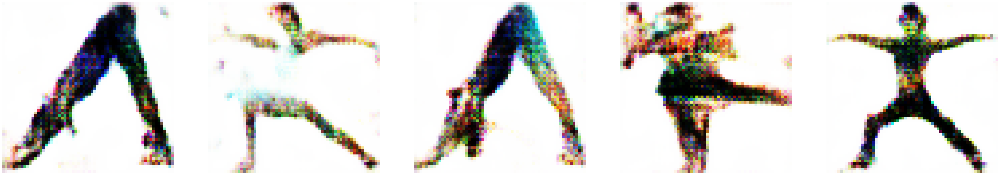

Epoch 56/120 
Duration: 167.84787 
D Loss: 0.29725 
G Loss: 2.63325


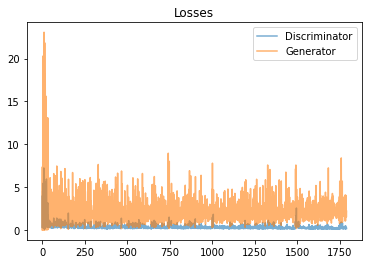

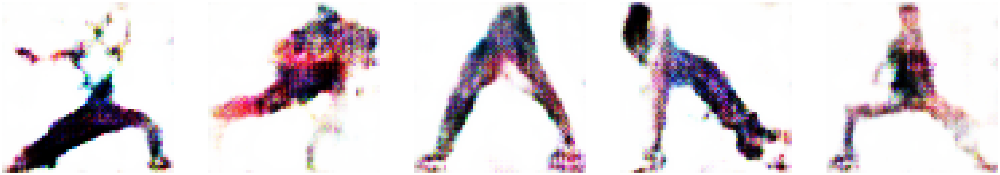

Epoch 57/120 
Duration: 166.52867 
D Loss: 0.23172 
G Loss: 2.51724


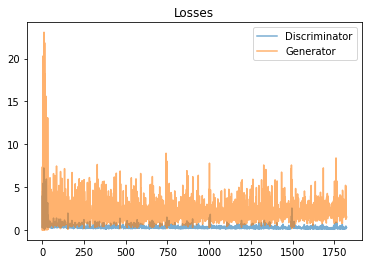

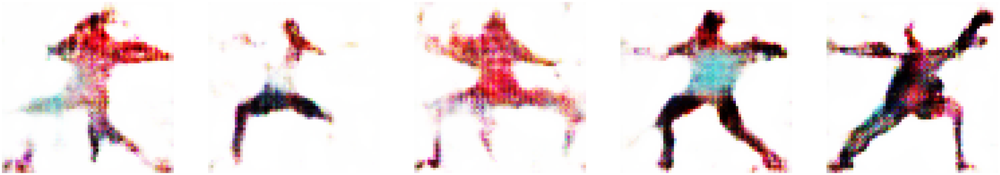

Epoch 58/120 
Duration: 167.15795 
D Loss: 0.21041 
G Loss: 2.27281


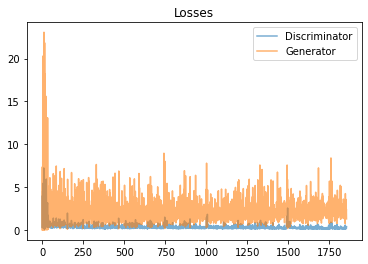

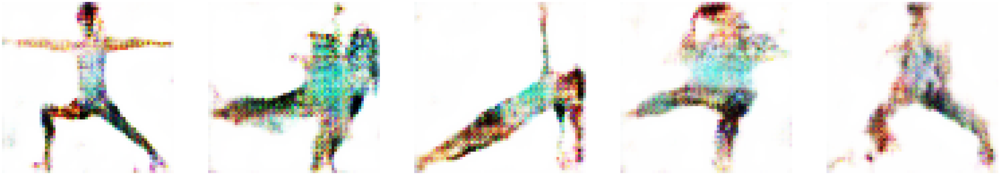

Epoch 59/120 
Duration: 168.44514 
D Loss: 0.19246 
G Loss: 2.50507


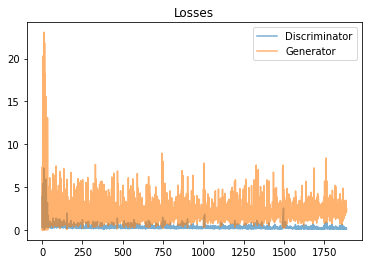

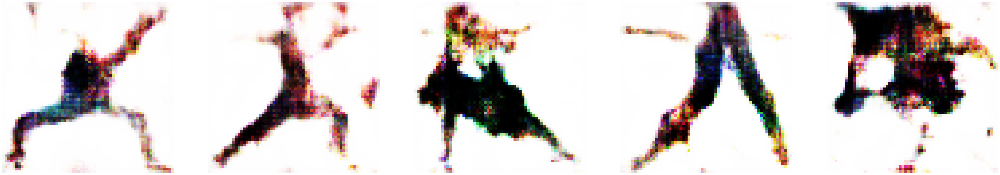

Epoch 60/120 
Duration: 167.57367 
D Loss: 0.21065 
G Loss: 2.47994


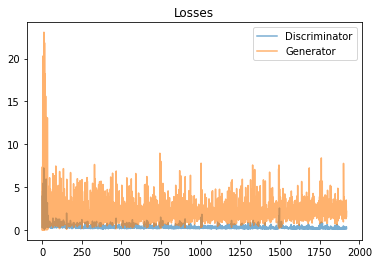

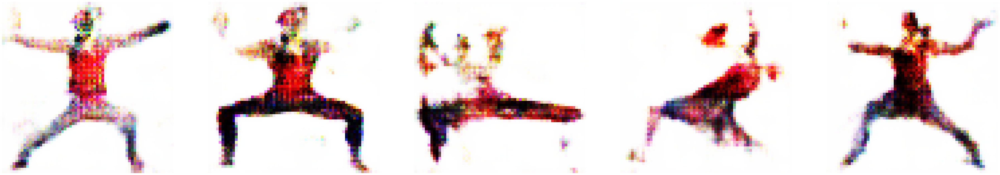

Epoch 61/120 
Duration: 168.07700 
D Loss: 0.48187 
G Loss: 2.89892


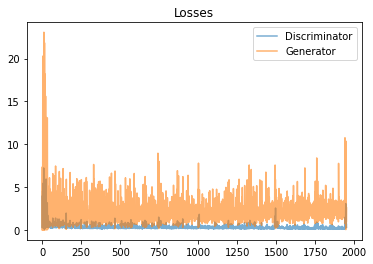

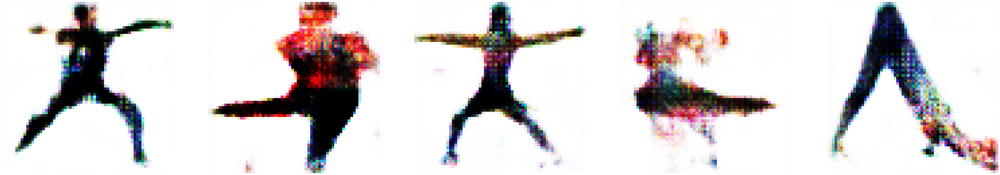

Epoch 62/120 
Duration: 167.59628 
D Loss: 0.38541 
G Loss: 2.05248


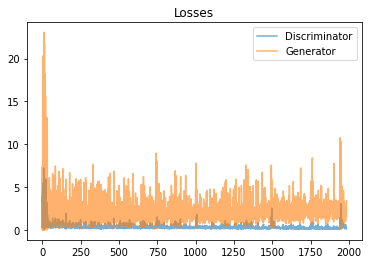

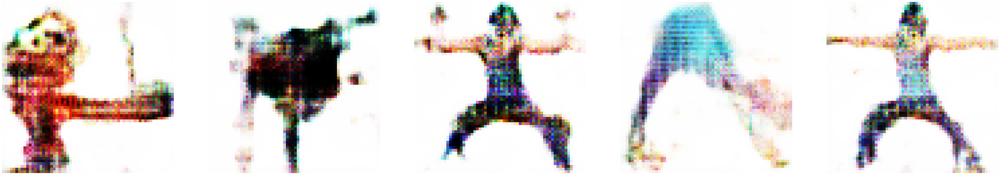

Epoch 63/120 
Duration: 168.86697 
D Loss: 0.26838 
G Loss: 2.22887


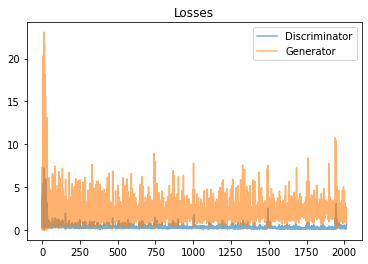

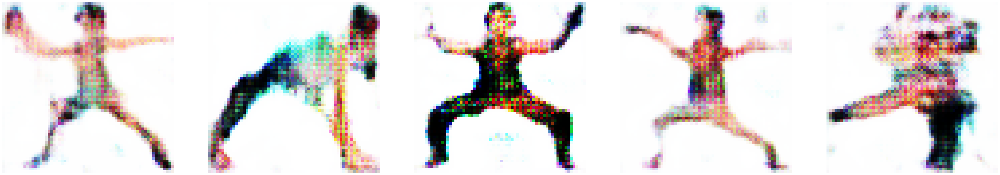

Epoch 64/120 
Duration: 167.02524 
D Loss: 0.29227 
G Loss: 2.47150


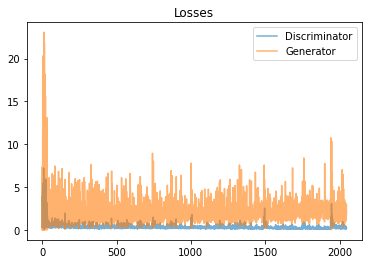

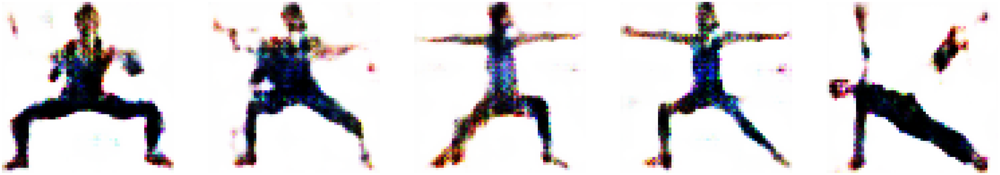

Epoch 65/120 
Duration: 169.19731 
D Loss: 0.17690 
G Loss: 2.33079


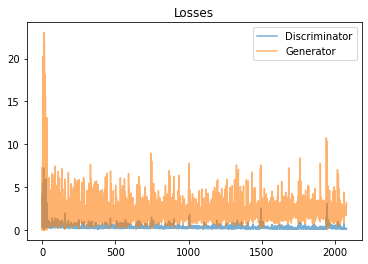

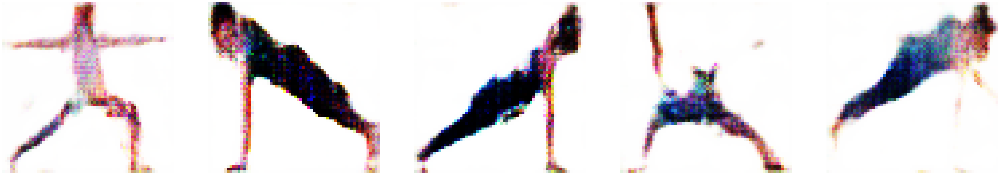

Epoch 66/120 
Duration: 168.76207 
D Loss: 0.20593 
G Loss: 2.24227


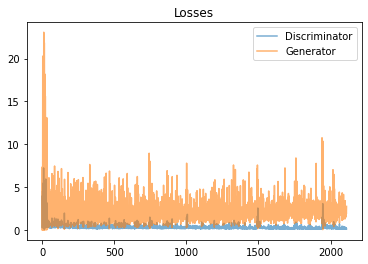

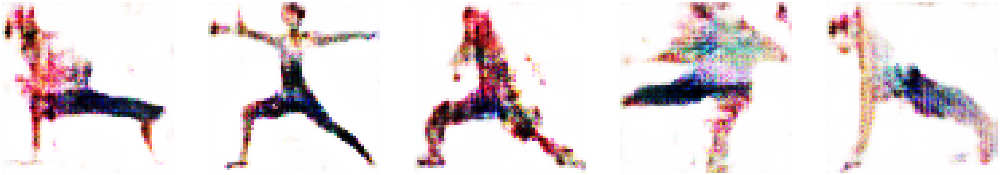

Epoch 67/120 
Duration: 169.26185 
D Loss: 0.19541 
G Loss: 2.35988


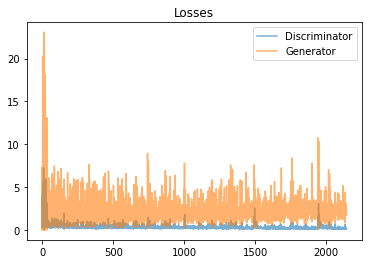

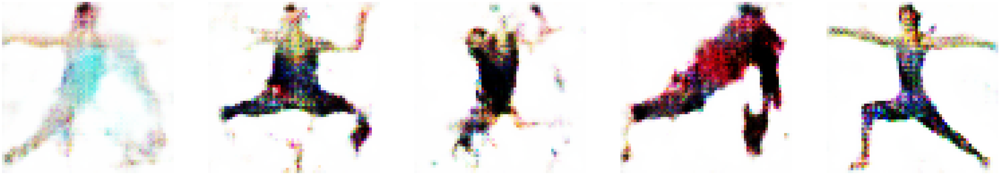

Epoch 68/120 
Duration: 168.99151 
D Loss: 0.18977 
G Loss: 2.37609


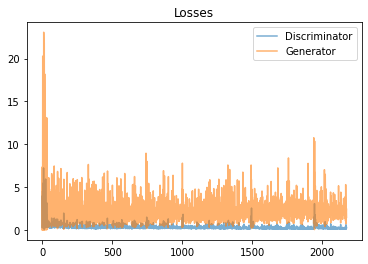

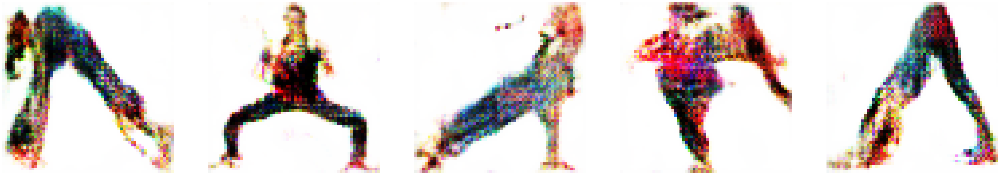

Epoch 69/120 
Duration: 169.22182 
D Loss: 0.16854 
G Loss: 2.35405


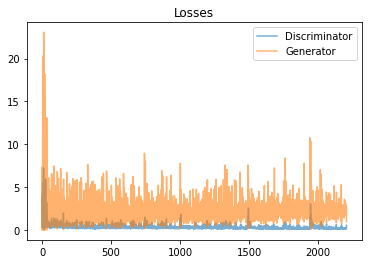

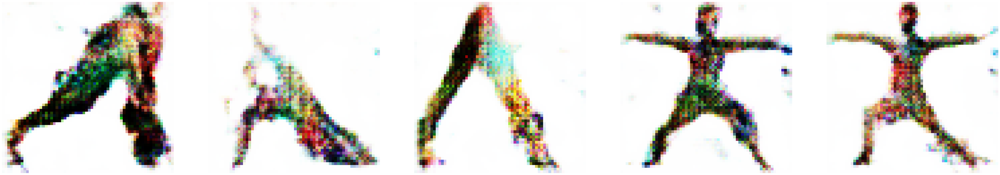

Epoch 70/120 
Duration: 174.95563 
D Loss: 0.13943 
G Loss: 2.50483


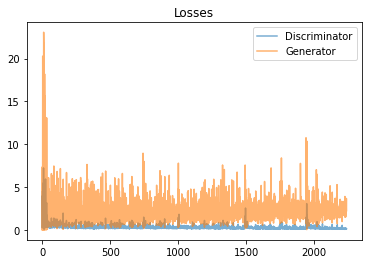

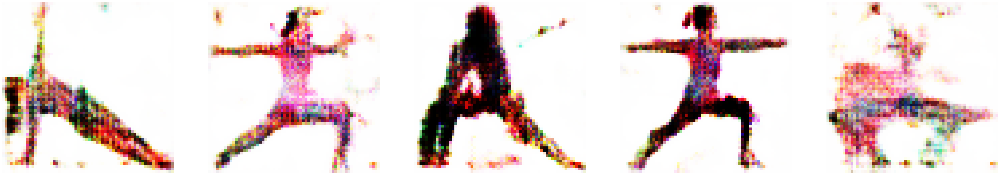

Epoch 71/120 
Duration: 178.66971 
D Loss: 0.15815 
G Loss: 2.51053


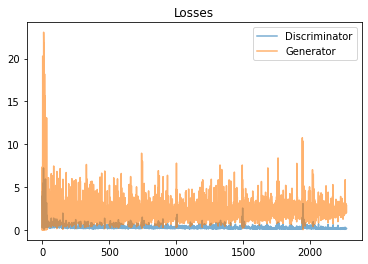

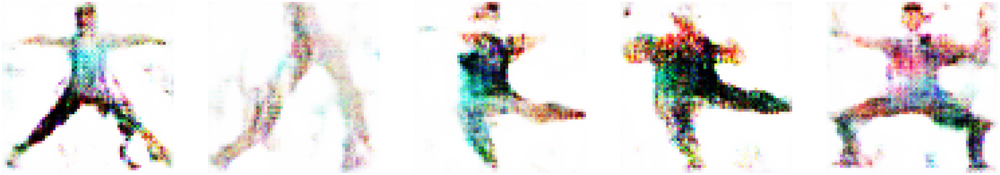

Epoch 72/120 
Duration: 174.86692 
D Loss: 0.20473 
G Loss: 3.02686


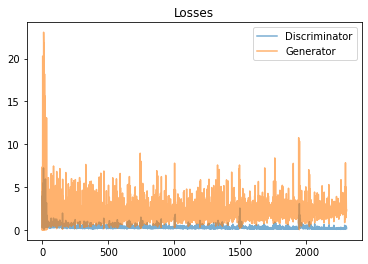

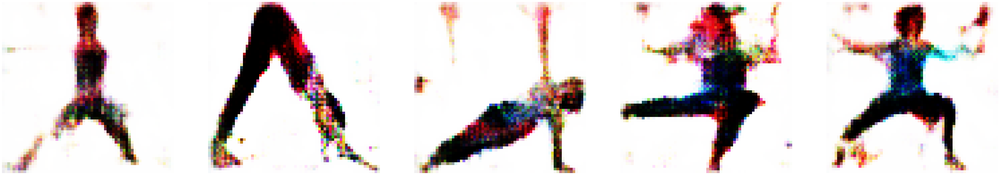

Epoch 73/120 
Duration: 174.92262 
D Loss: 0.16396 
G Loss: 2.57304


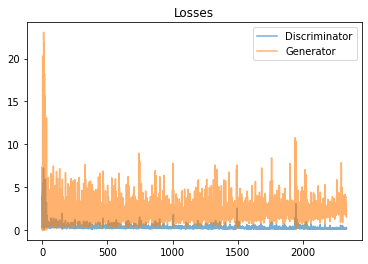

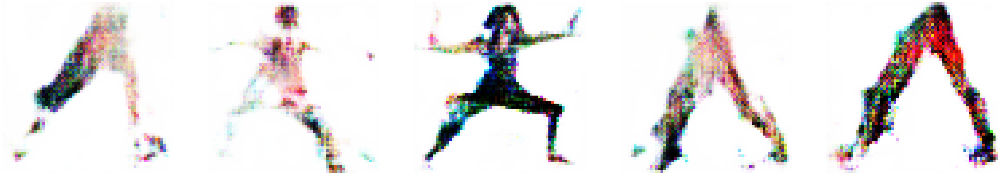

Epoch 74/120 
Duration: 175.47030 
D Loss: 0.13873 
G Loss: 2.52502


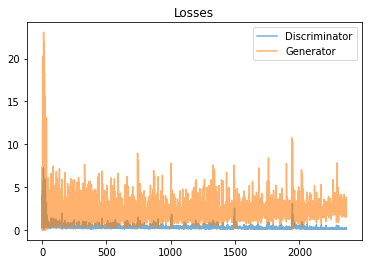

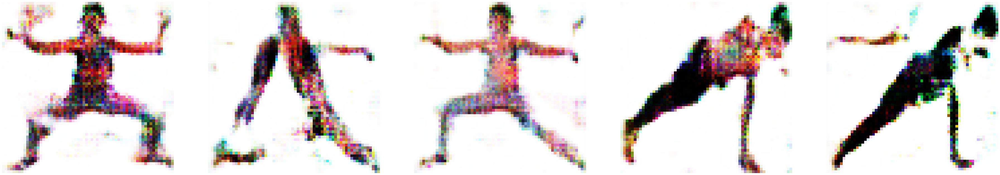

Epoch 75/120 
Duration: 175.13888 
D Loss: 0.17754 
G Loss: 2.60032


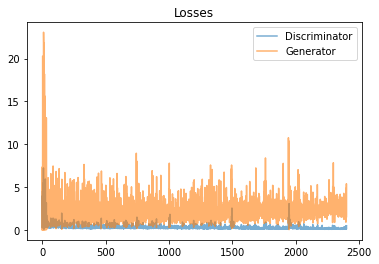

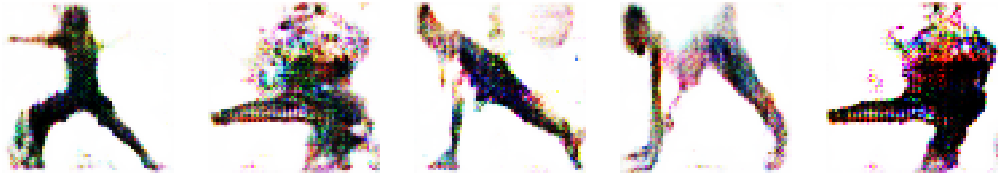

Epoch 76/120 
Duration: 174.10190 
D Loss: 0.17112 
G Loss: 3.02801


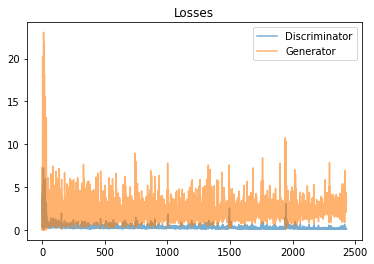

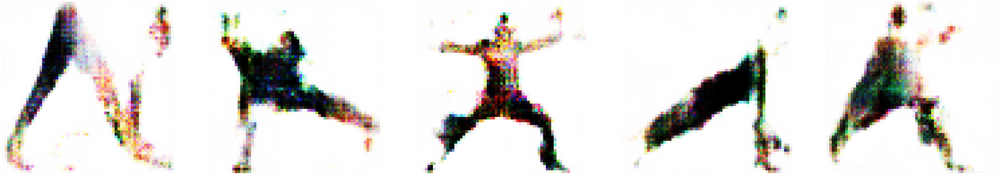

Epoch 77/120 
Duration: 179.36455 
D Loss: 0.13135 
G Loss: 2.79018


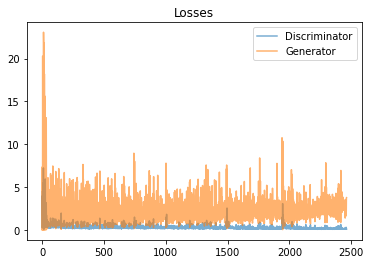

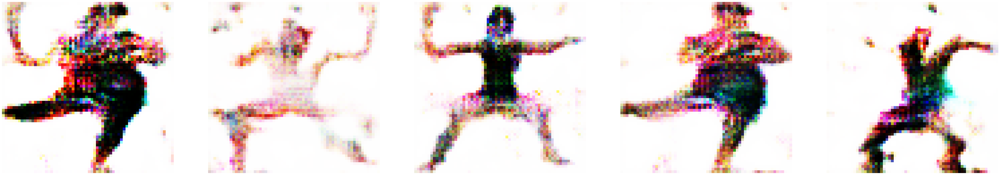

Epoch 78/120 
Duration: 178.18669 
D Loss: 0.14547 
G Loss: 2.77671


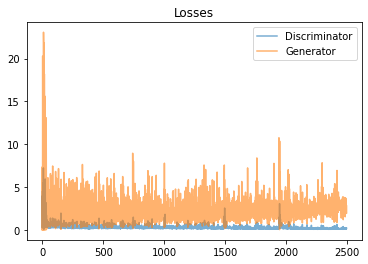

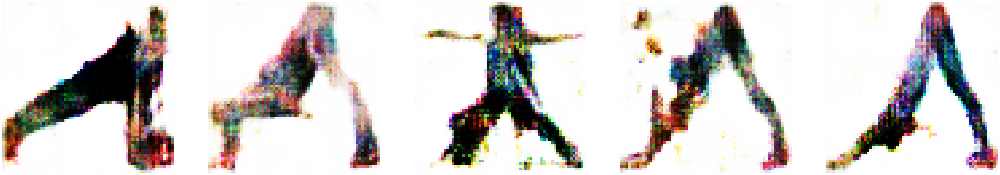

Epoch 79/120 
Duration: 170.60448 
D Loss: 0.79710 
G Loss: 3.50788


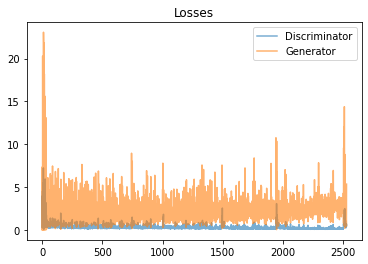

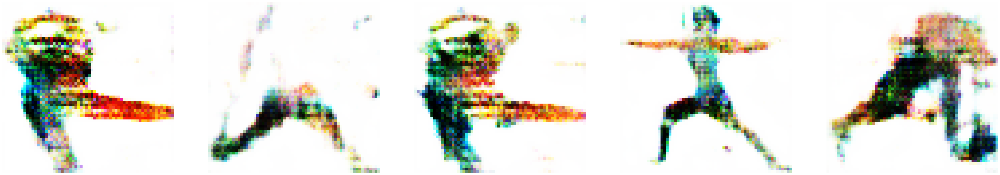

Epoch 80/120 
Duration: 170.23927 
D Loss: 0.40496 
G Loss: 2.24457


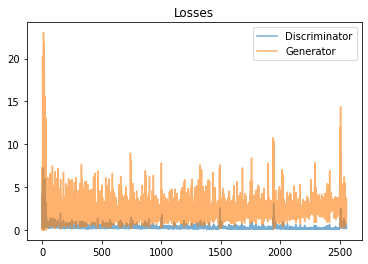

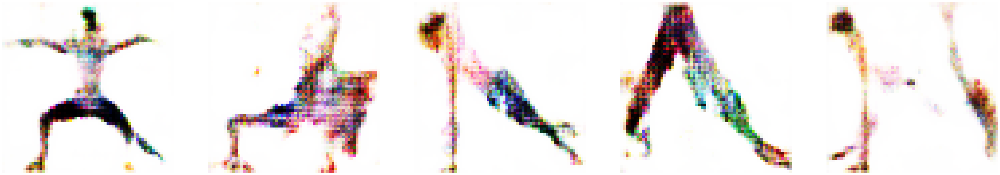

Epoch 81/120 
Duration: 169.81645 
D Loss: 0.26941 
G Loss: 2.39537


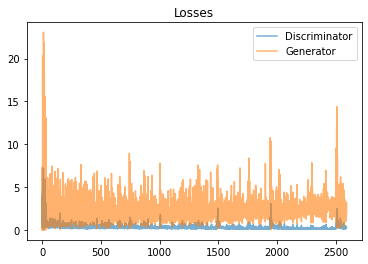

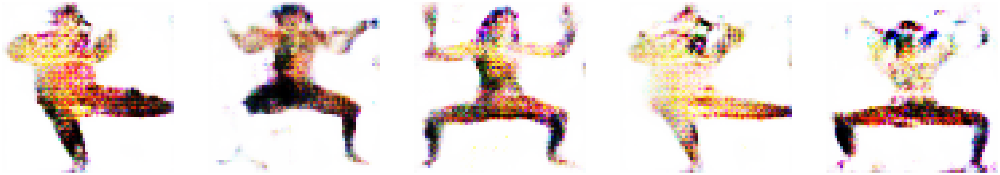

Epoch 82/120 
Duration: 169.44664 
D Loss: 0.19673 
G Loss: 2.40439


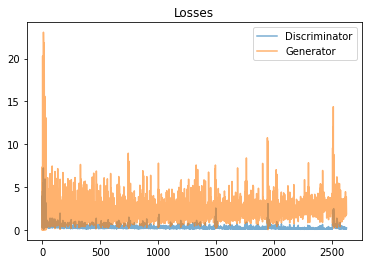

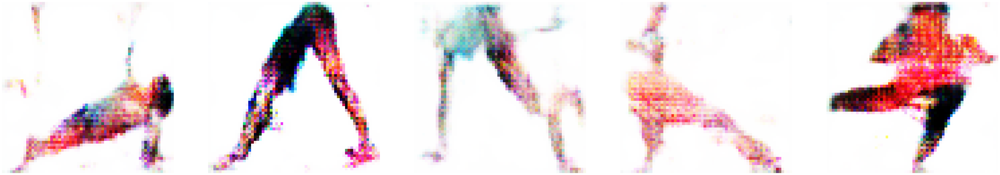

Epoch 83/120 
Duration: 170.75393 
D Loss: 0.15571 
G Loss: 2.37697


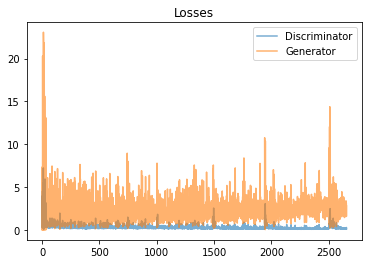

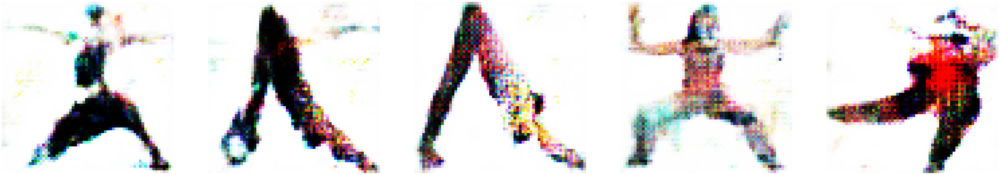

Epoch 84/120 
Duration: 172.39844 
D Loss: 0.20035 
G Loss: 2.45080


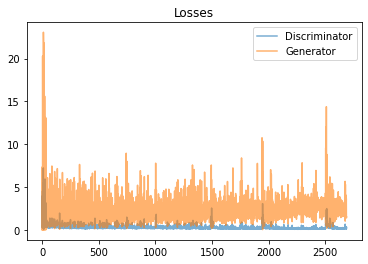

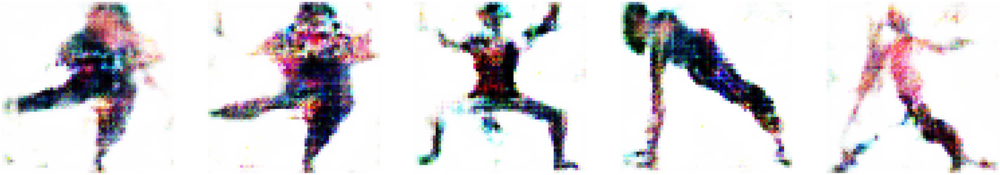

Epoch 85/120 
Duration: 174.28696 
D Loss: 0.16689 
G Loss: 2.57910


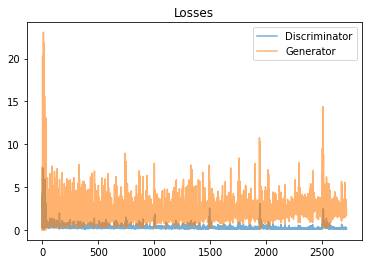

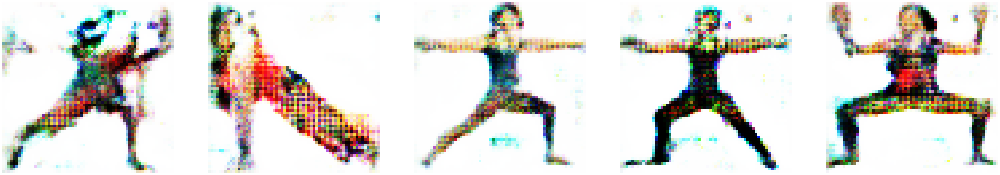

Epoch 86/120 
Duration: 170.64314 
D Loss: 0.17491 
G Loss: 2.77643


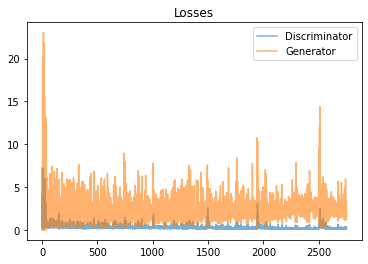

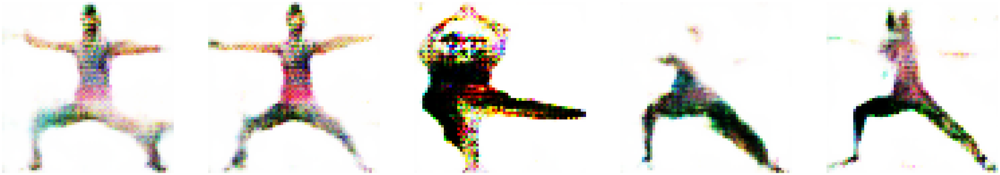

Epoch 87/120 
Duration: 172.24371 
D Loss: 0.18174 
G Loss: 2.67502


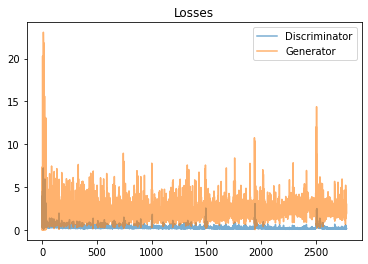

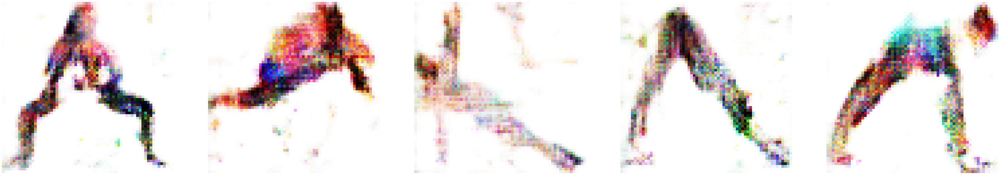

Epoch 88/120 
Duration: 173.55877 
D Loss: 0.14021 
G Loss: 2.67540


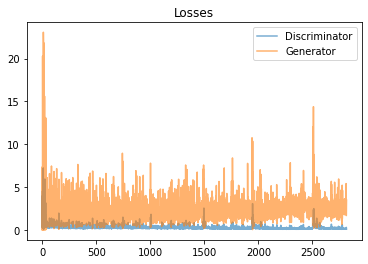

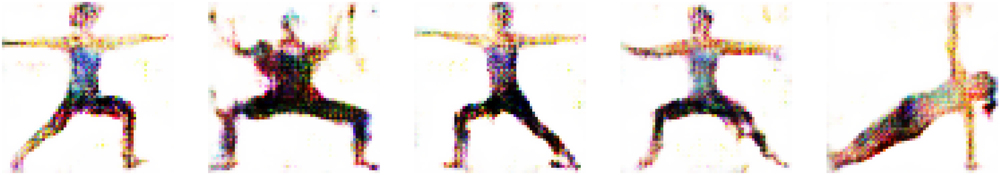

Epoch 89/120 
Duration: 173.01523 
D Loss: 0.12968 
G Loss: 2.80317


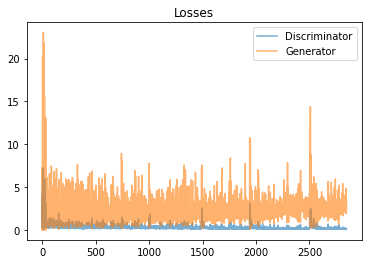

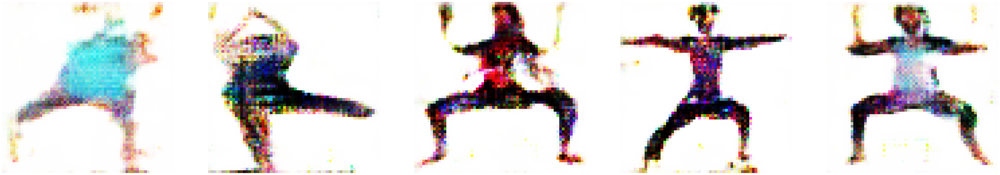

Epoch 90/120 
Duration: 174.52826 
D Loss: 0.11310 
G Loss: 2.86499


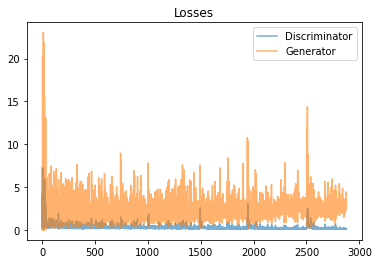

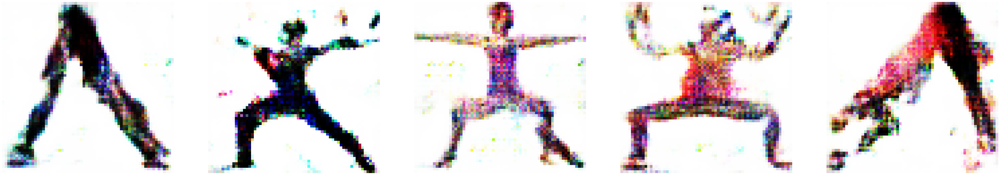

Epoch 91/120 
Duration: 175.29351 
D Loss: 0.11310 
G Loss: 3.16265


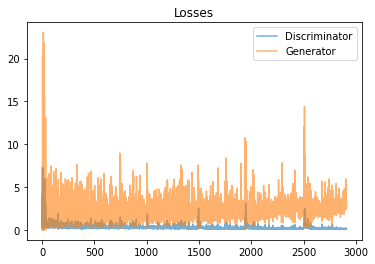

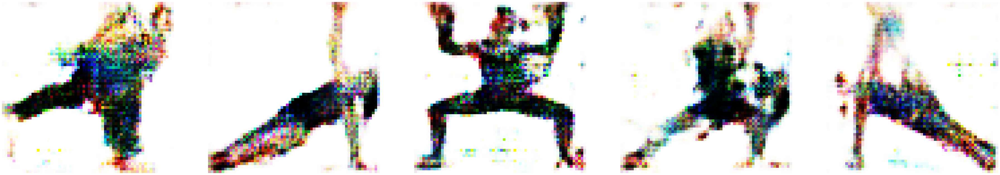

Epoch 92/120 
Duration: 174.28417 
D Loss: 0.11273 
G Loss: 2.86572


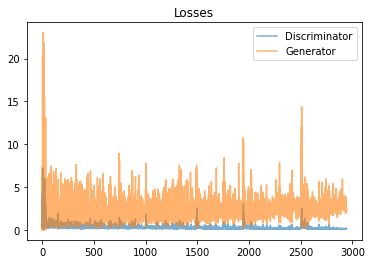

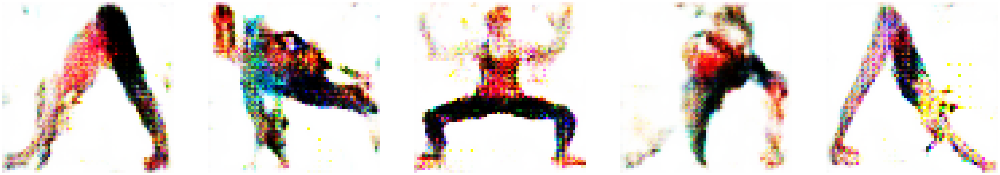

Epoch 93/120 
Duration: 175.19220 
D Loss: 0.10616 
G Loss: 3.25105


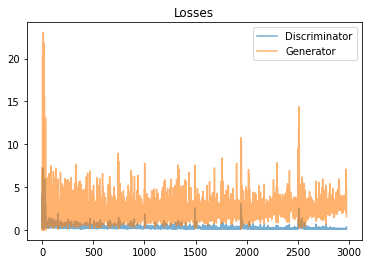

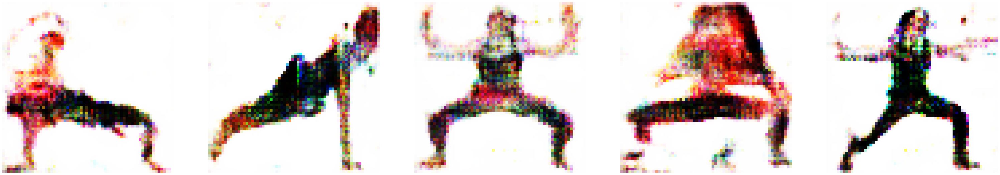

Epoch 94/120 
Duration: 171.48598 
D Loss: 0.10001 
G Loss: 3.32769


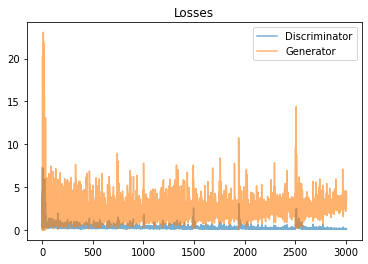

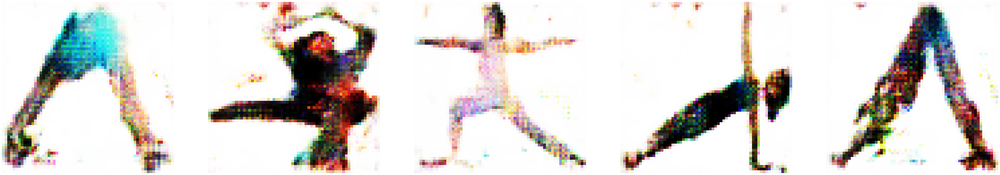

Epoch 95/120 
Duration: 170.42229 
D Loss: 0.10142 
G Loss: 3.30934


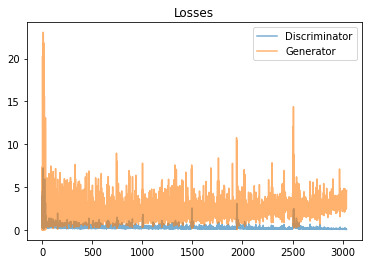

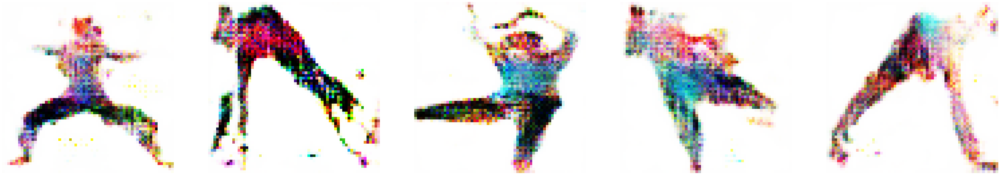

Epoch 96/120 
Duration: 165.10999 
D Loss: 0.11966 
G Loss: 3.23390


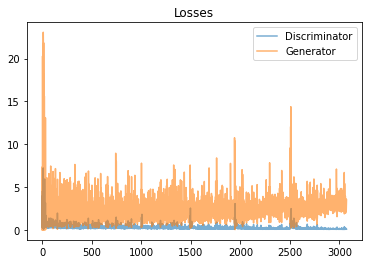

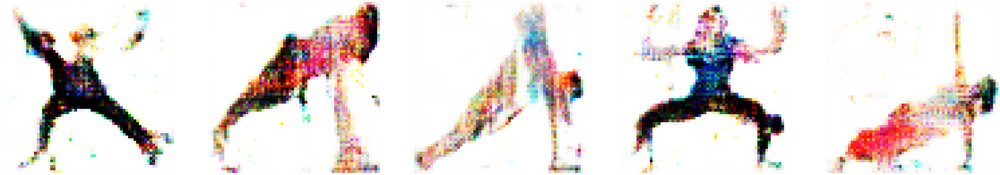

Epoch 97/120 
Duration: 167.61882 
D Loss: 0.13061 
G Loss: 3.06521


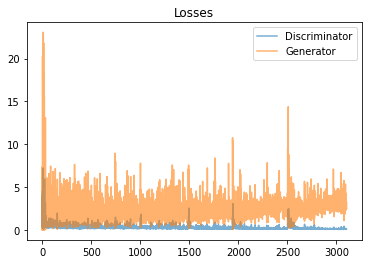

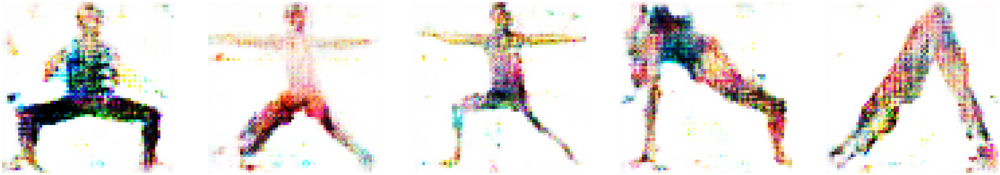

Epoch 98/120 
Duration: 167.36239 
D Loss: 0.13403 
G Loss: 3.22315


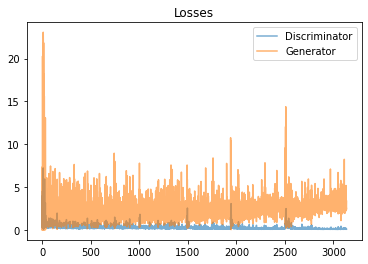

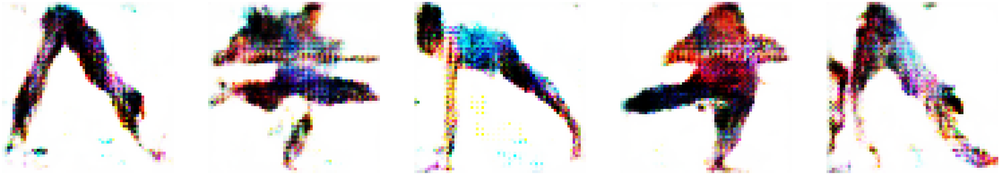

Epoch 99/120 
Duration: 168.58629 
D Loss: 0.78524 
G Loss: 3.80679


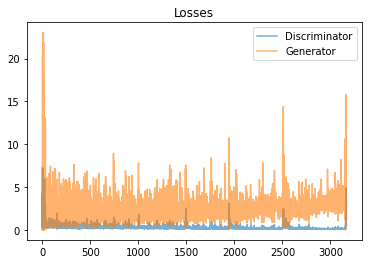

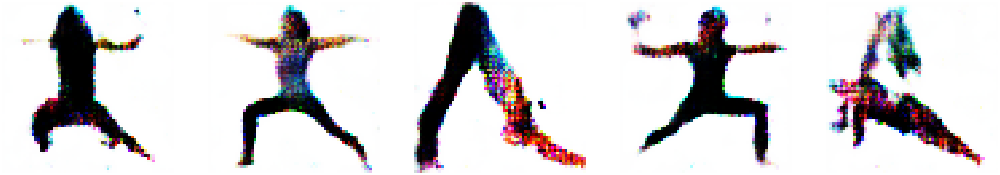

Epoch 100/120 
Duration: 169.63666 
D Loss: 0.54050 
G Loss: 2.35174


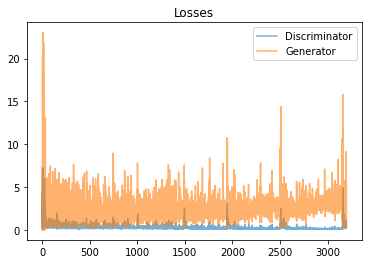

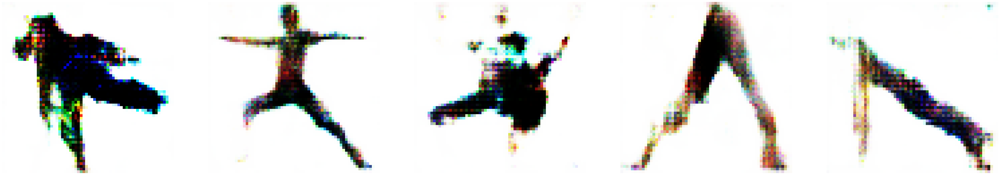

Epoch 101/120 
Duration: 171.93349 
D Loss: 0.30741 
G Loss: 2.32458


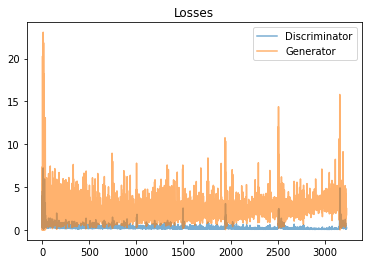

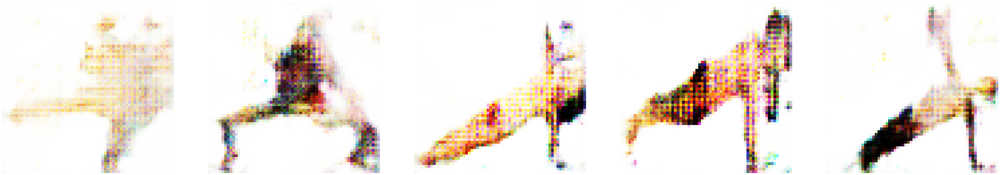

Epoch 102/120 
Duration: 168.36969 
D Loss: 0.20827 
G Loss: 2.50829


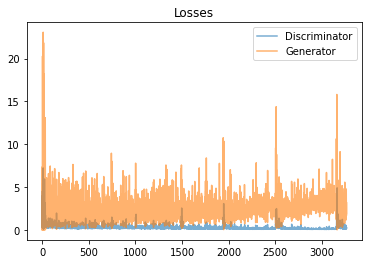

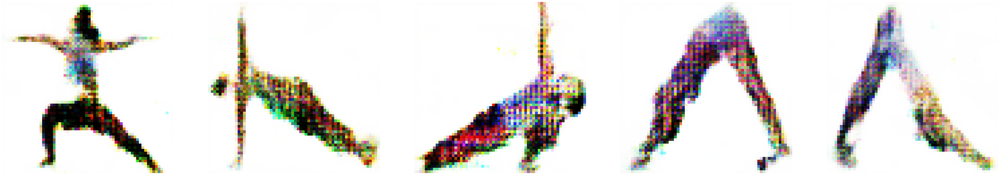

Epoch 103/120 
Duration: 170.00302 
D Loss: 0.16720 
G Loss: 2.40335


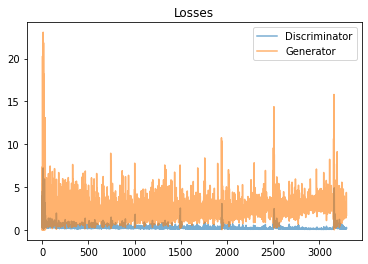

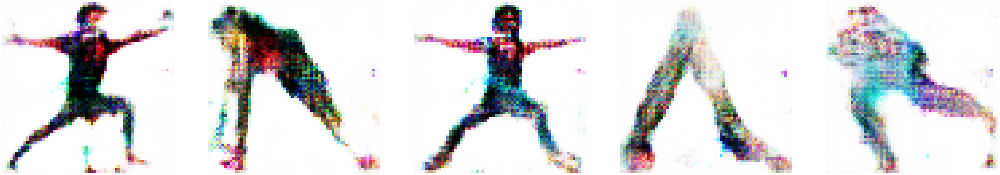

Epoch 104/120 
Duration: 170.79537 
D Loss: 0.17372 
G Loss: 2.74076


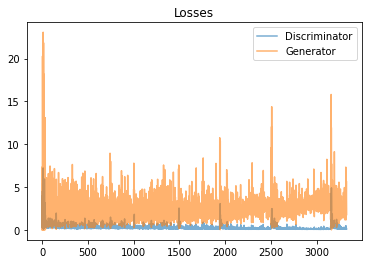

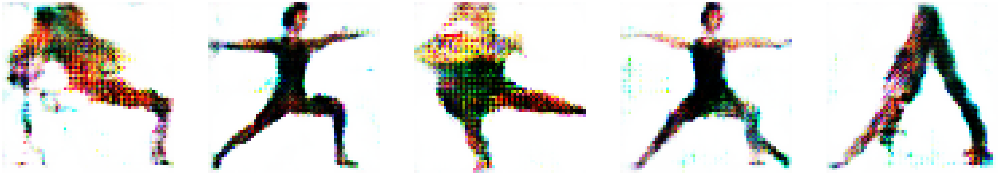

Epoch 105/120 
Duration: 171.38679 
D Loss: 0.21030 
G Loss: 2.60247


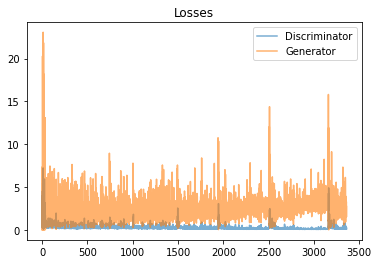

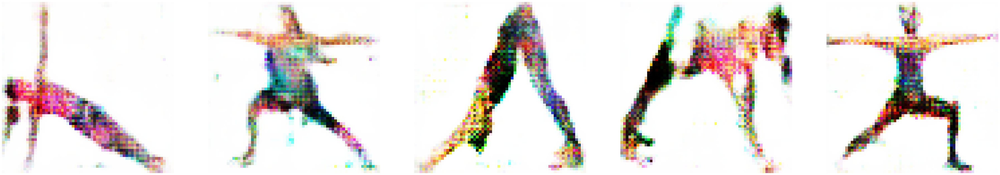

Epoch 106/120 
Duration: 170.43203 
D Loss: 0.13994 
G Loss: 2.72878


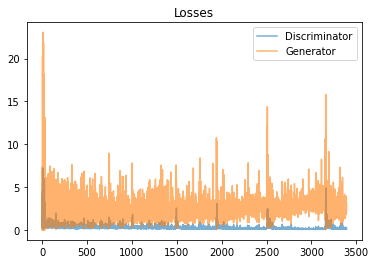

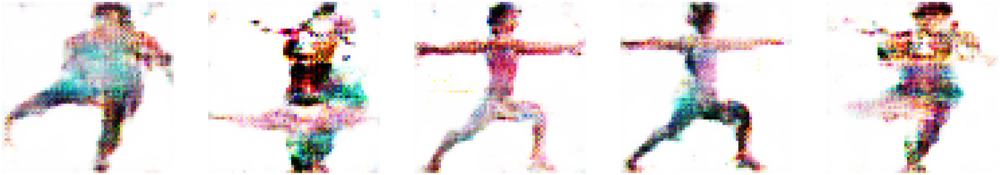

Epoch 107/120 
Duration: 166.54260 
D Loss: 0.11858 
G Loss: 2.69255


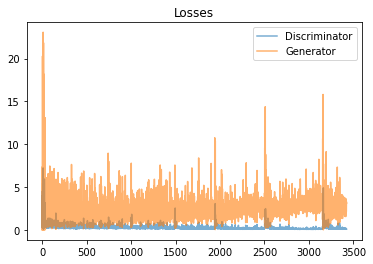

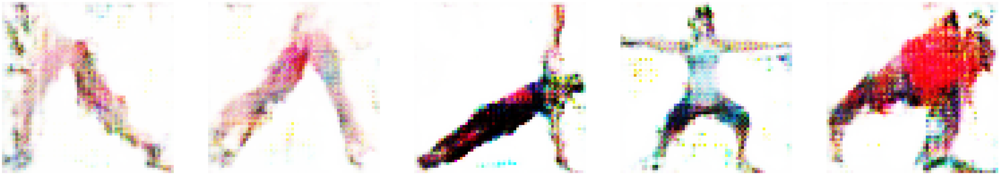

Epoch 108/120 
Duration: 167.65371 
D Loss: 0.11402 
G Loss: 2.62936


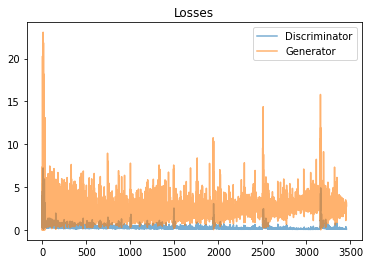

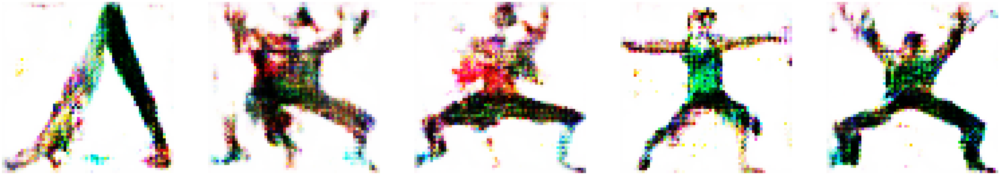

Epoch 109/120 
Duration: 167.49965 
D Loss: 0.10325 
G Loss: 2.92662


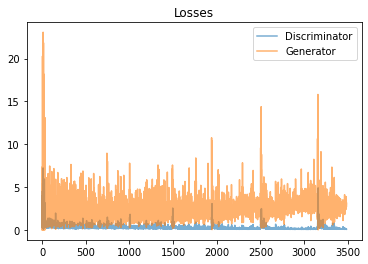

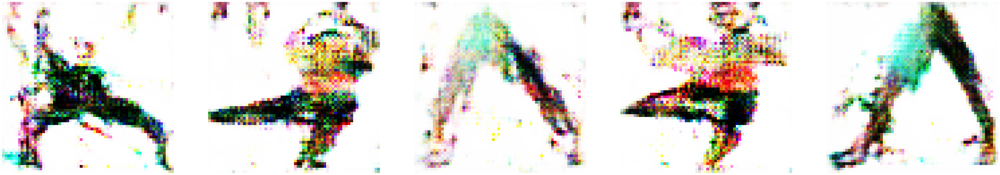

Epoch 110/120 
Duration: 166.90247 
D Loss: 0.09632 
G Loss: 2.89540


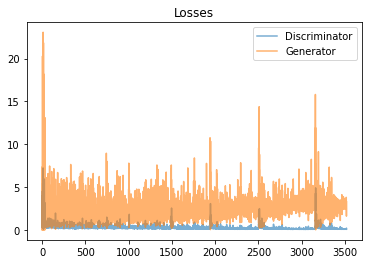

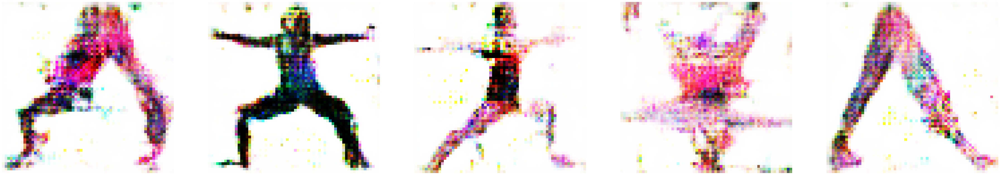

Epoch 111/120 
Duration: 167.24496 
D Loss: 0.08957 
G Loss: 3.01112


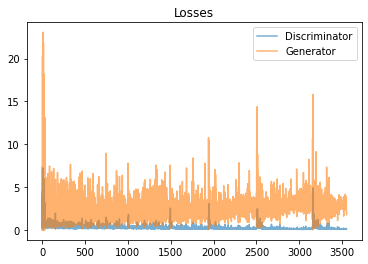

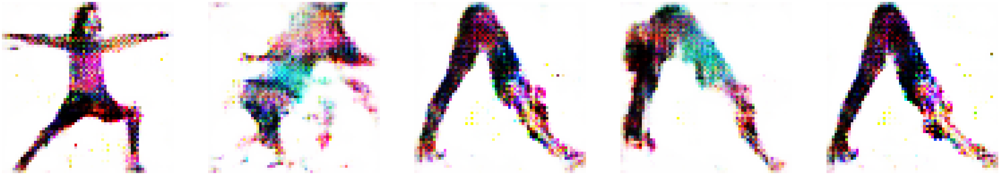

Epoch 112/120 
Duration: 167.37179 
D Loss: 0.09804 
G Loss: 2.98985


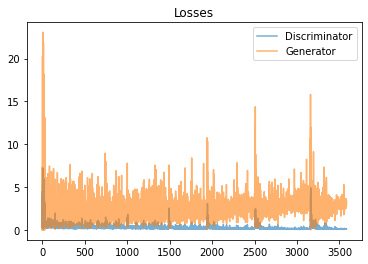

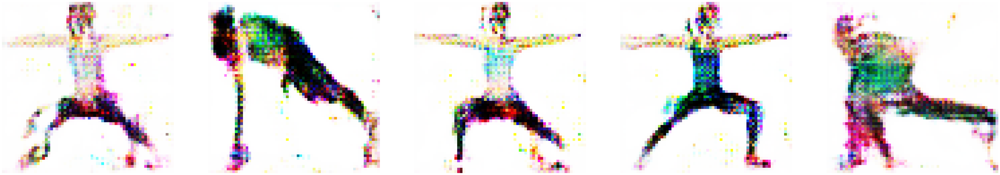

Epoch 113/120 
Duration: 167.60823 
D Loss: 0.08965 
G Loss: 3.08977


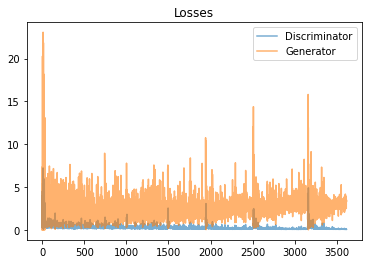

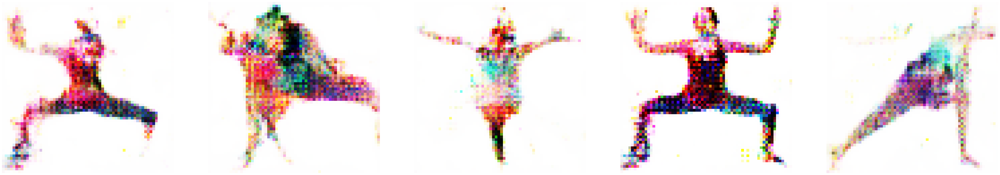

Epoch 114/120 
Duration: 167.29226 
D Loss: 0.10194 
G Loss: 3.45894


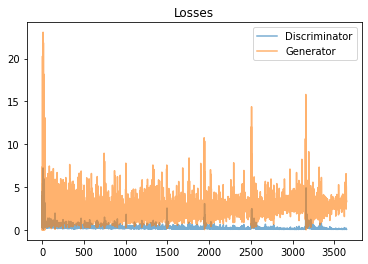

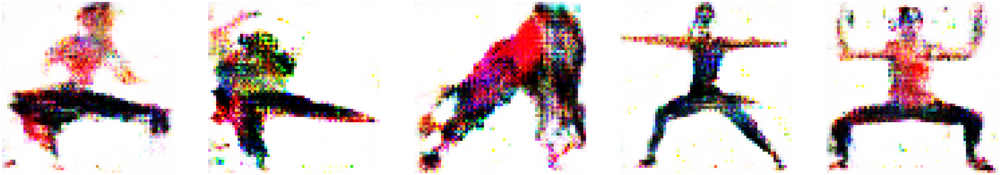

Epoch 115/120 
Duration: 167.43084 
D Loss: 0.09019 
G Loss: 3.34022


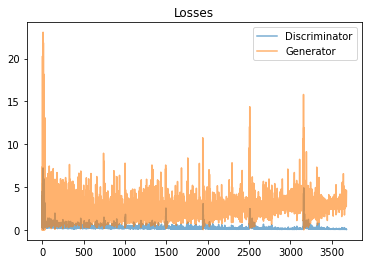

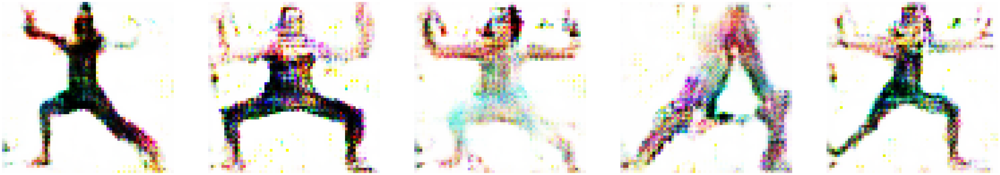

Epoch 116/120 
Duration: 168.62729 
D Loss: 0.08459 
G Loss: 3.26865


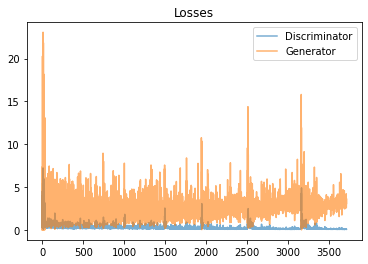

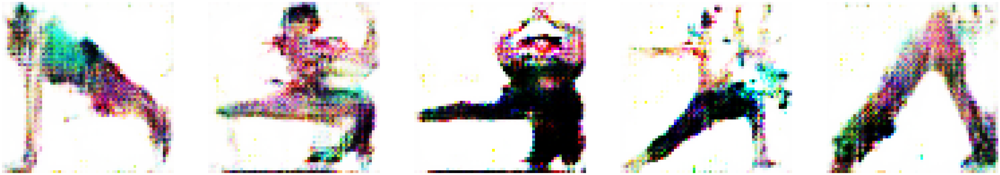

Epoch 117/120 
Duration: 168.14520 
D Loss: 0.10782 
G Loss: 3.66351


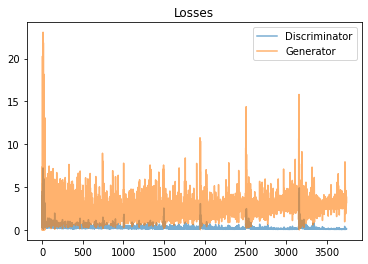

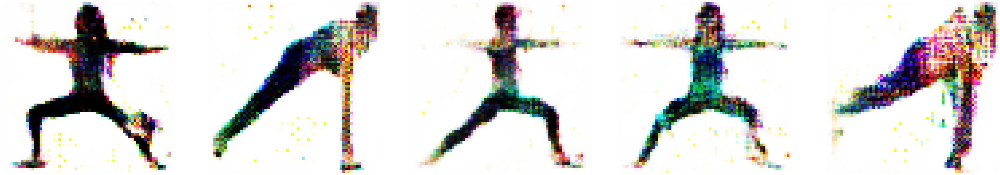

In [ ]:
 start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

## 4. Save generated yoga poses

In [ ]:
!zip -r ./generated-images.zip ./generated-images/

In [ ]:
from google.colab import files
files.download("/content/generated-images.zip")

In [ ]:
imgs = os.listdir('generated-images')
print ("images = ",len(imgs))

plt.figure(figsize=(10,10))
for i,image in enumerate(imgs):
    im= Image.open('generated-images/'+image)
    plt.subplot(3,3,i+1)
    plt.axis("off")
    plt.imshow(im)    
    if(i==8):
        break